In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
#import umap
import pandas as pd

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir

In [4]:
DATASET_ID = 'insect_dataset_cricket_segmented'

In [5]:
from avgn.utils.hparams import HParams
from avgn.dataset import DataSet

In [6]:
from avgn.signalprocessing.create_spectrogram_dataset import prepare_wav, create_label_df, get_row_audio

### create dataset

In [7]:
hparams = HParams(
    num_mel_bins = 32,
    mel_lower_edge_hertz=2000,
    mel_upper_edge_hertz=10000,
    butter_lowcut = 500,
    butter_highcut = 10000,
    ref_level_db = 20,
    min_level_db = -10,
    mask_spec = True,
    win_length_ms = 1,
    hop_length_ms = 0.1,
    mask_spec_kwargs = {"spec_thresh": 0.9, "offset": 1e-10},
    nex=-1,
    n_jobs=-1,
    verbosity = 1,
)

In [8]:
# create a dataset object
dataset = DataSet(DATASET_ID, hparams = hparams)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   13.1s


[Parallel(n_jobs=-1)]: Done 107 out of 107 | elapsed:   13.3s finished


In [9]:
dataset.sample_json

OrderedDict([('species_id', 'hama-suzu'),
             ('species', 'Gryllidae sp.'),
             ('common_name', 'cricket'),
             ('wav_loc', '/mnt/cube/Datasets/insectORIG/CR_hama-suzu.wav'),
             ('samplerate_hz', 44100),
             ('length_s', 30.934784580498867),
             ('indvs',
              OrderedDict([('hama-suzu',
                            OrderedDict([('syllables',
                                          OrderedDict([('start_times',
                                                        [0.193,
                                                         0.207,
                                                         0.22,
                                                         0.234,
                                                         0.249,
                                                         0.263,
                                                         0.278,
                                                         0.292,
           

In [10]:
len(dataset.data_files)

107

#### Create dataset based upon JSON

In [11]:
from joblib import Parallel, delayed
n_jobs = -1; verbosity = 10

In [12]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(create_label_df)(
            dataset.data_files[key].data,
            hparams=dataset.hparams,
            labels_to_retain=[],
            unit="syllables",
            dict_features_to_retain = [],
            key = key,
        )
        for key in tqdm(dataset.data_files.keys())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.5s


[Parallel(n_jobs=-1)]: Done  71 out of 107 | elapsed:    1.6s remaining:    0.8s
[Parallel(n_jobs=-1)]: Done  82 out of 107 | elapsed:    1.6s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done  93 out of 107 | elapsed:    1.7s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 104 out of 107 | elapsed:    1.7s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 107 out of 107 | elapsed:    1.7s finished


24966

In [13]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key
0,0.193,0.200,hama-suzu,0,CR_hama-suzu
1,0.207,0.211,hama-suzu,0,CR_hama-suzu
2,0.220,0.226,hama-suzu,0,CR_hama-suzu


In [14]:
(np.min(np.array(syllable_df.end_time - syllable_df.start_time)))*1000

2.999999999996561

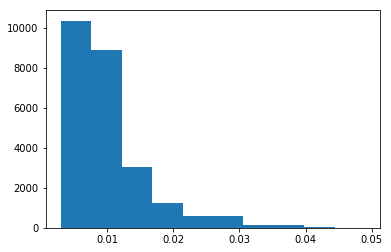

In [ ]:
plt.hist(np.array(syllable_df.end_time - syllable_df.start_time));

### get audio for dataset

In [ ]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(get_row_audio)(
            syllable_df[syllable_df.key == key], 
            dataset.data_files[key].data['wav_loc'], 
            dataset.hparams
        )
        for key in tqdm(syllable_df.key.unique())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done  68 out of 104 | elapsed:    1.4s remaining:    0.8s
[Parallel(n_jobs=-1)]: Done  79 out of 104 | elapsed:    1.5s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done  90 out of 104 | elapsed:    1.5s remaining:    0.2s


[Parallel(n_jobs=-1)]: Done 101 out of 104 | elapsed:    1.5s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 104 out of 104 | elapsed:    1.6s finished


24966

In [ ]:
df_mask  = np.array([len(i) > 0 for i in tqdm(syllable_df.audio.values)])

In [ ]:
syllable_df = syllable_df[np.array(df_mask)]

In [ ]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key,audio,rate
0,0.193,0.200,hama-suzu,0,CR_hama-suzu,"[-0.037513810696223775, -0.02586491069160058, ...",44100
1,0.207,0.211,hama-suzu,0,CR_hama-suzu,"[-0.055875309406379955, -0.027412375910938196,...",44100
2,0.220,0.226,hama-suzu,0,CR_hama-suzu,"[-0.023157868757154452, -0.02392670072702537, ...",44100


In [ ]:
sylls = syllable_df.audio.values

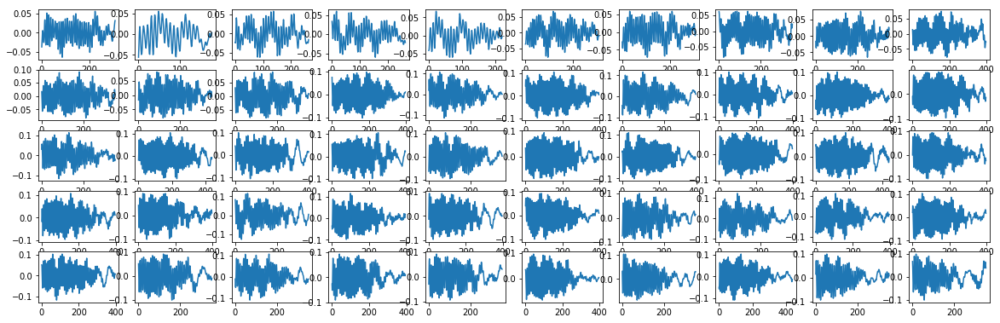

In [ ]:
nrows = 5
ncols = 10
zoom = 2
fig, axs = plt.subplots(ncols=ncols, nrows = nrows,figsize = (ncols*zoom, nrows+zoom/1.5))
for i, syll in tqdm(enumerate(sylls), total = nrows*ncols):
    ax = axs.flatten()[i]
    ax.plot(syll)
    if i == nrows*ncols -1:
        break

In [ ]:
syllable_df['audio'] = [i/np.max(i) for i in syllable_df.audio.values]

In [ ]:
syll_lens = np.array([len(i) for i in syllable_df['audio']])

In [ ]:
syllable_df = syllable_df[(syll_lens >= 100)]

105 4.653960350157523


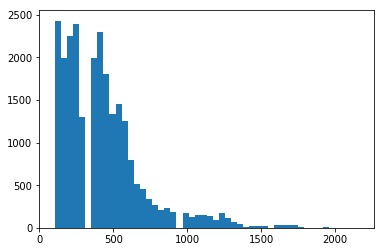

In [ ]:
syll_lens = [len(i) for i in syllable_df['audio']]
print(np.min(syll_lens), np.log(np.min(syll_lens)))
plt.hist(syll_lens, bins = 50);

### Create spectrograms

In [ ]:
from avgn.visualization.spectrogram import draw_spec_set
from avgn.signalprocessing.create_spectrogram_dataset import make_spec, mask_spec, log_resize_spec, pad_spectrogram

In [ ]:
syllables_wav = syllable_df.audio.values
syllables_rate = syllable_df.rate.values

In [ ]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    # create spectrograms
    syllables_spec = parallel(
        delayed(make_spec)(
            syllable,
            rate,
            hparams=dataset.hparams,
            mel_matrix=dataset.mel_matrix,
            use_mel=True,
            use_tensorflow=False,
        )
        for syllable, rate in tqdm(
            zip(syllables_wav, syllables_rate),
            total=len(syllables_rate),
            desc="getting syllable spectrograms",
            leave=False,
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0414s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1448s.) Setting batch_size=22.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 304 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 454 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 1664 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 2126 tasks      | elapsed:    0.9s
[Parallel

[Parallel(n_jobs=-1)]: Done 24959 out of 24959 | elapsed:    8.1s finished


27 3.295836866004329


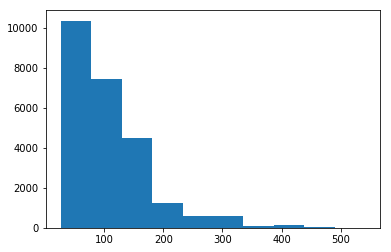

In [ ]:
syll_lens = [np.shape(i)[1] for i in syllables_spec]
print(np.min(syll_lens), np.log(np.min(syll_lens)))
plt.hist(syll_lens);

In [ ]:
#syllables_spec = [i for i in syllables_spec if np.shape(i)[1] > 5]

### Rescale spectrogram
- using log rescaling

In [ ]:
log_scaling_factor = 4

In [ ]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllables_spec = parallel(
        delayed(log_resize_spec)(spec, scaling_factor=log_scaling_factor)
        for spec in tqdm(syllables_spec, desc="scaling spectrograms", leave=False)
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0176s.) Setting batch_size=22.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0586s.) Setting batch_size=150.
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 422 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 752 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3174 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 5724 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 8574 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 11424 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 14574 tasks      | elapsed:    2.1s
[Pa

[Parallel(n_jobs=-1)]: Done 24959 out of 24959 | elapsed:    3.4s finished


(25.0, 10) (320, 800) 25.0 32 800


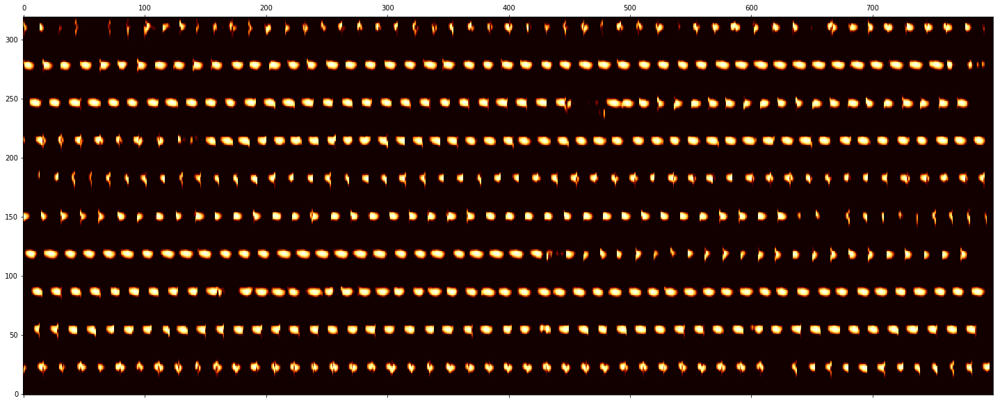

In [ ]:
draw_spec_set(syllables_spec[5000:], zoom=1, maxrows=10, colsize=25)

### Pad spectrograms

In [ ]:
syll_lens = [np.shape(i)[1] for i in syllables_spec]
pad_length = np.max(syll_lens)

In [ ]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key,audio,rate
0,0.193,0.200,hama-suzu,0,CR_hama-suzu,"[-0.6639166872996428, -0.4577553041124974, -0....",44100
1,0.207,0.211,hama-suzu,0,CR_hama-suzu,"[-1.007841382364717, -0.49444606437967525, 0.0...",44100
2,0.220,0.226,hama-suzu,0,CR_hama-suzu,"[-0.40503607090603333, -0.418483106275696, -0....",44100


In [ ]:
import seaborn as sns

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


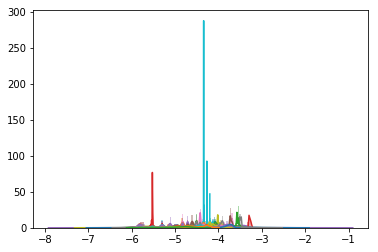

In [ ]:
for indv in np.unique(syllable_df.indv):
    sns.distplot(np.log(syllable_df[syllable_df.indv==indv]["end_time"] - syllable_df[syllable_df.indv==indv]["start_time"]), label=indv)
#plt.legend()

In [ ]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:

    syllables_spec = parallel(
        delayed(pad_spectrogram)(spec, pad_length)
        for spec in tqdm(
            syllables_spec, desc="padding spectrograms", leave=False
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0254s.) Setting batch_size=14.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1235s.) Setting batch_size=44.
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 286 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 496 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 764 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 1512 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 2348 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 3184 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 4108 tasks      | elapsed:    1.4s
[Parall

[Parallel(n_jobs=-1)]: Done 22896 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 24959 out of 24959 | elapsed:    4.2s finished


In [ ]:
def norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))

In [ ]:
def remove_med(x):
    x[x<=np.median(x)] = 0
    return x

In [ ]:
syllables_spec = [(norm(i)*255).astype('uint8') for i in tqdm(syllables_spec)]
syllables_spec = [remove_med(i) for i in tqdm(syllables_spec)]

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


(25.0, 10) (320, 800) 25.0 32 800


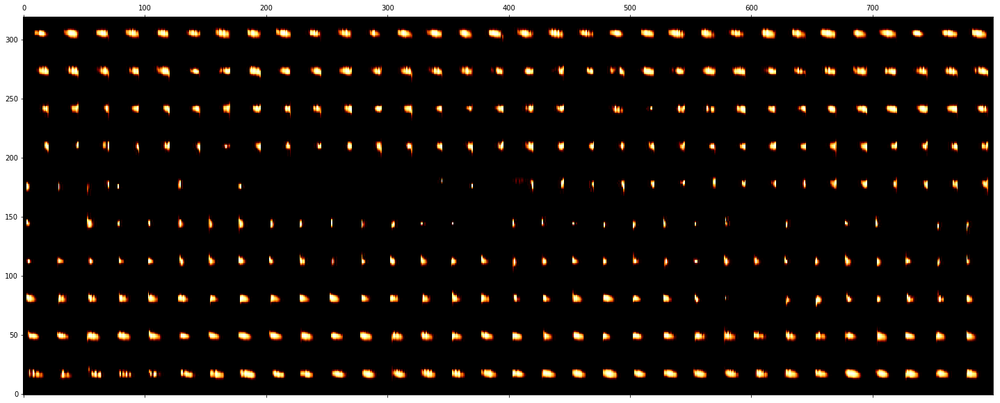

In [ ]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=25)

In [ ]:
np.shape(syllables_spec)

(24959, 32, 25)

In [ ]:
syllable_df['spectrogram'] = syllables_spec

In [ ]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key,audio,rate,spectrogram
0,0.193,0.200,hama-suzu,0,CR_hama-suzu,"[-0.6639166872996428, -0.4577553041124974, -0....",44100,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
1,0.207,0.211,hama-suzu,0,CR_hama-suzu,"[-1.007841382364717, -0.49444606437967525, 0.0...",44100,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
2,0.220,0.226,hama-suzu,0,CR_hama-suzu,"[-0.40503607090603333, -0.418483106275696, -0....",44100,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


### view syllables per indv

In [ ]:
syllable_df.indv.unique()

array(['hama-suzu', '682ss', '619ss', 'fieldcricket1', '577sl', '501ss',
       'ezo-suzu', 'kawara-suzu', '623ss', 'enma-koorogi', 'treecricket',
       '488ss', '453ss', '575sl', 'snowy', 'kumasuzumushi', 'madara-suzu',
       '470ss', 'ezo-enma', 'house', '621ss', '585ssh', '479scdg',
       '465ssdw', 'kinhibari', '585ss', 'kuma-koorogi', '593ss',
       'kusahibari', 'yamato-hibari', '686ss', '588ss', 'kurotsuya',
       '671ss', '481ss', '491srds', '441ss', 'hime-koorogi', '612ss',
       '587ss', '684ss', '551ss', '499sl', '479ss', '443ss', '480ssdw2',
       '483ss', '585sso', 'hime-suzu', 'kamado', '440ss', 'moriokame2',
       'fall', 'mitsukado', '482scdg', '437ss', '468ssdw', '467ssdw',
       '442ss', '591sl', '624ss', '462sl', '672ss', '454ss', '685ss',
       '475scl', '590ss', '438ss', 'spring', 'kaya-hibari', '613ss',
       'tanbo-koorogi', 'tanbookame', '452ss', '521ss', '489ss', '679ss',
       'kuchinaga', '475sct', 'taiwan-enma', 'northern', '622ss',
       '466ss

437ss 45
(50.0, 4) (64, 800) 25.0 32 800


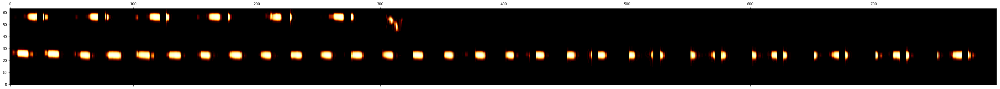

438ss 61
(50.0, 4) (64, 800) 25.0 32 800


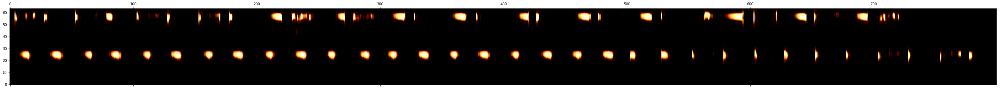

440ss 52
(50.0, 4) (64, 800) 25.0 32 800


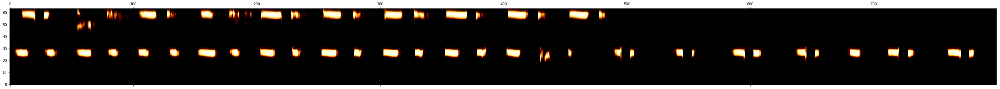

441ss 52
(50.0, 4) (64, 800) 25.0 32 800


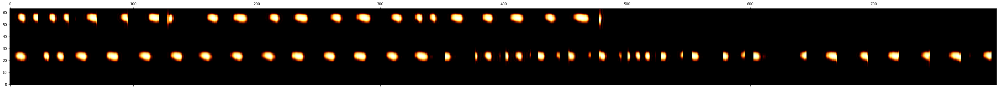

442ss 84
(50.0, 6) (96, 800) 25.0 32 800


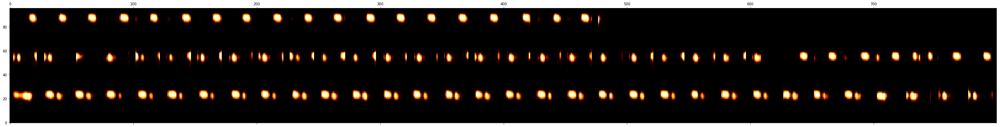

443ss 63
(50.0, 4) (64, 800) 25.0 32 800


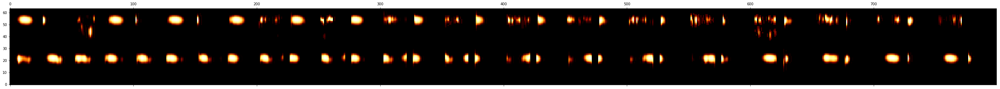

446ss 20
(50.0, 2) (32, 800) 25.0 32 800


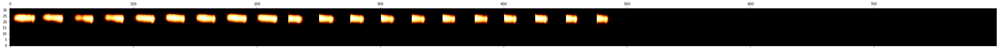

450ss 40
(50.0, 4) (64, 800) 25.0 32 800


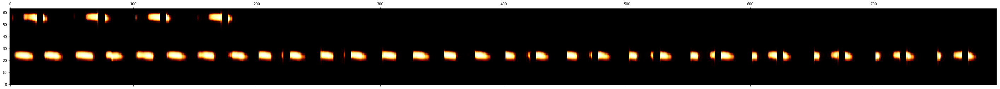

452ss 31
(50.0, 2) (32, 800) 25.0 32 800


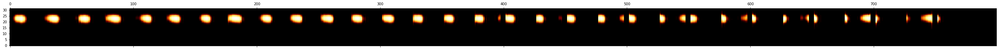

453ss 40
(50.0, 4) (64, 800) 25.0 32 800


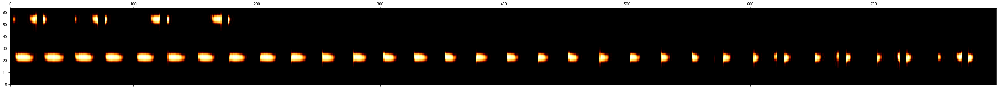

454ss 31
(50.0, 2) (32, 800) 25.0 32 800


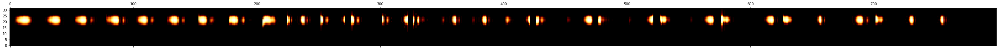

462sl 111
(50.0, 8) (128, 800) 25.0 32 800


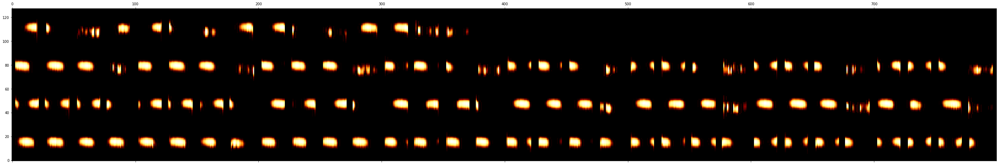

464sldw 240
(50.0, 16) (256, 800) 25.0 32 800


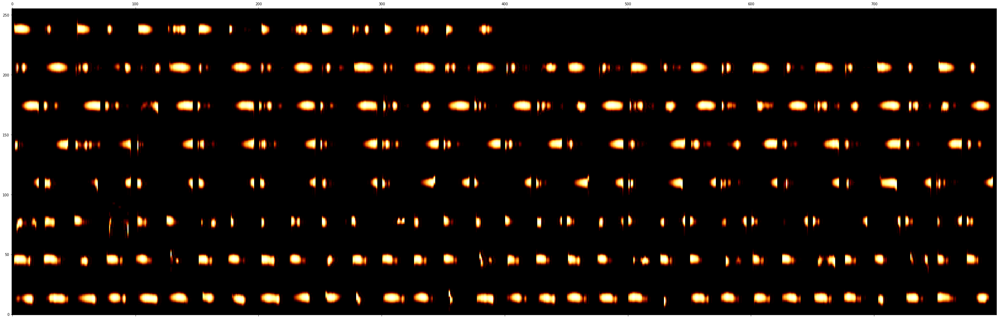

465ssdw 57
(50.0, 4) (64, 800) 25.0 32 800


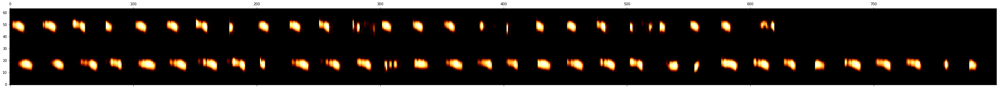

466ssdw 69
(50.0, 6) (96, 800) 25.0 32 800


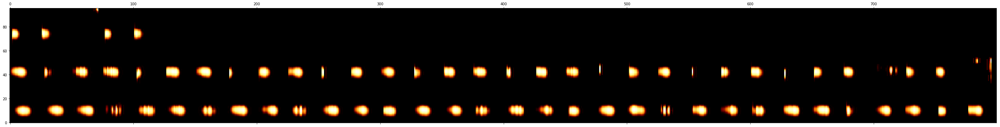

467ssdw 109
(50.0, 8) (128, 800) 25.0 32 800


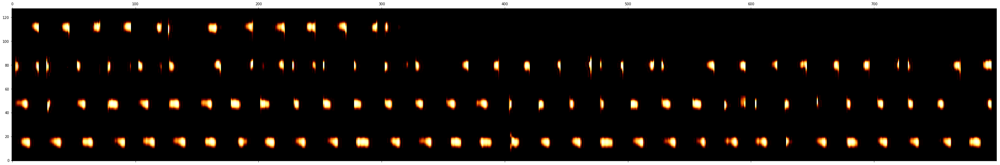

468ssdw 79
(50.0, 6) (96, 800) 25.0 32 800


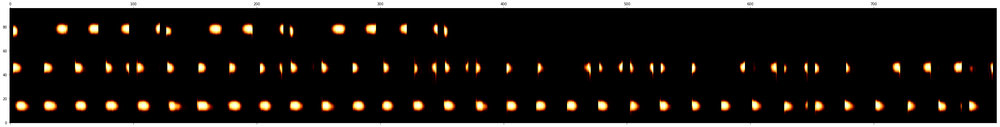

470ss 78
(50.0, 6) (96, 800) 25.0 32 800


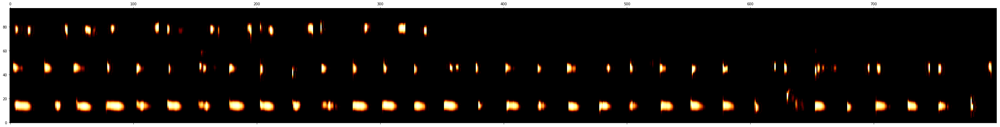

475scl 182
(50.0, 12) (192, 800) 25.0 32 800


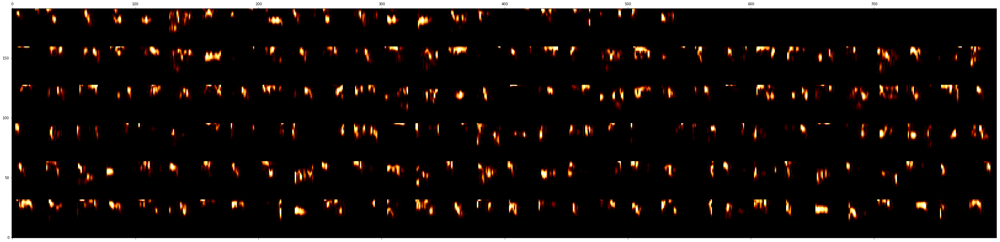

475sct 155
(50.0, 10) (160, 800) 25.0 32 800


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in less
  after removing the cwd from sys.path.


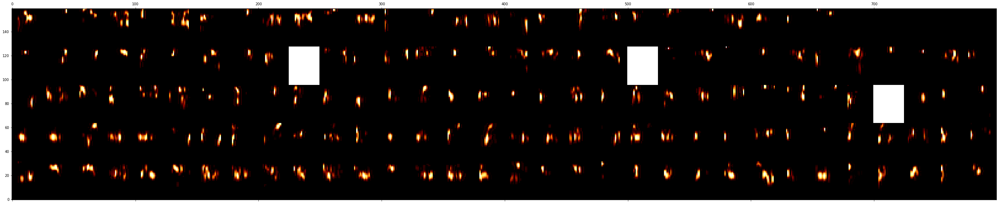

479scdg 20
(50.0, 2) (32, 800) 25.0 32 800


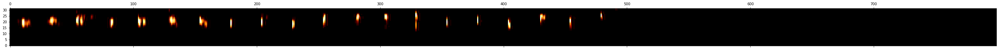

479ss 301
(50.0, 20) (320, 800) 25.0 32 800


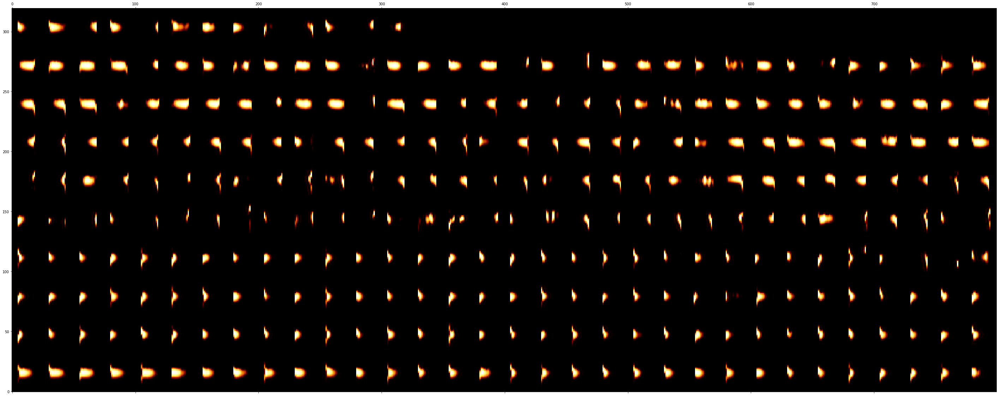

480ssdw1 197
(50.0, 14) (224, 800) 25.0 32 800


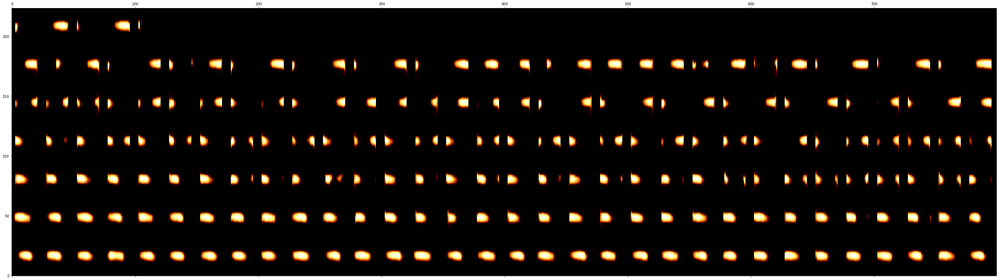

480ssdw2 135
(50.0, 10) (160, 800) 25.0 32 800


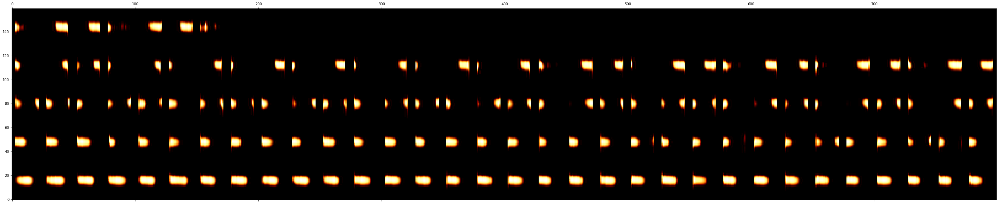

481ss 38
(50.0, 4) (64, 800) 25.0 32 800


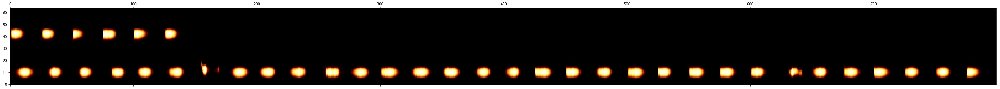

482scdg 74
(50.0, 6) (96, 800) 25.0 32 800


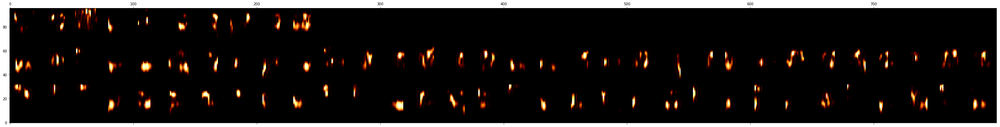

483ss 47
(50.0, 4) (64, 800) 25.0 32 800


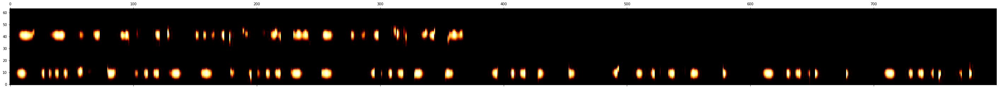

484ss 51
(50.0, 4) (64, 800) 25.0 32 800


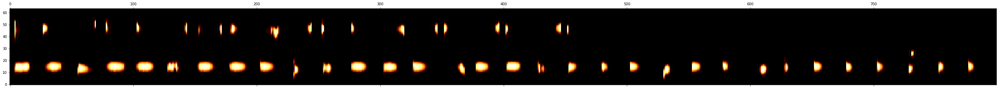

487sl 54
(50.0, 4) (64, 800) 25.0 32 800


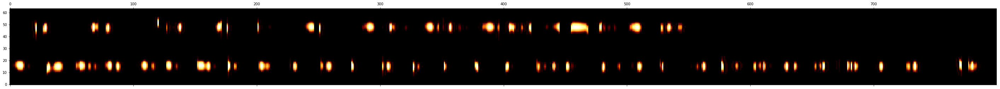

488ss 48
(50.0, 4) (64, 800) 25.0 32 800


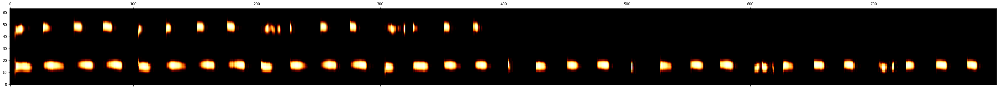

489ss 36
(50.0, 4) (64, 800) 25.0 32 800


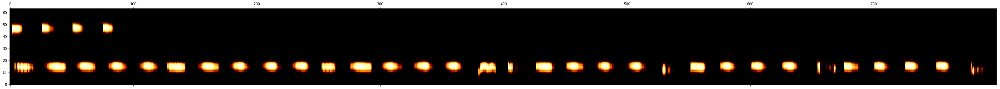

491srds 156
(50.0, 10) (160, 800) 25.0 32 800


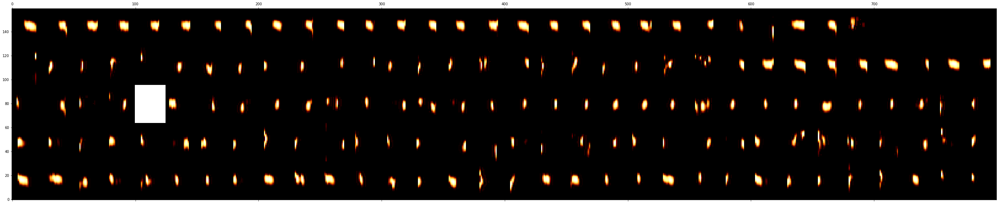

499sl 361
(50.0, 24) (384, 800) 25.0 32 800


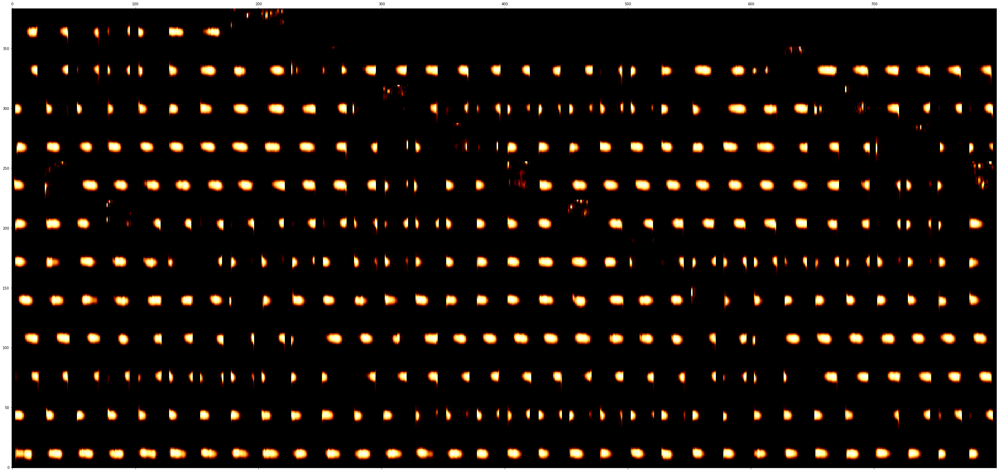

501ss 85
(50.0, 6) (96, 800) 25.0 32 800


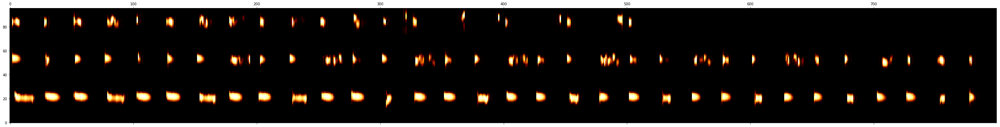

521ss 353
(50.0, 24) (384, 800) 25.0 32 800


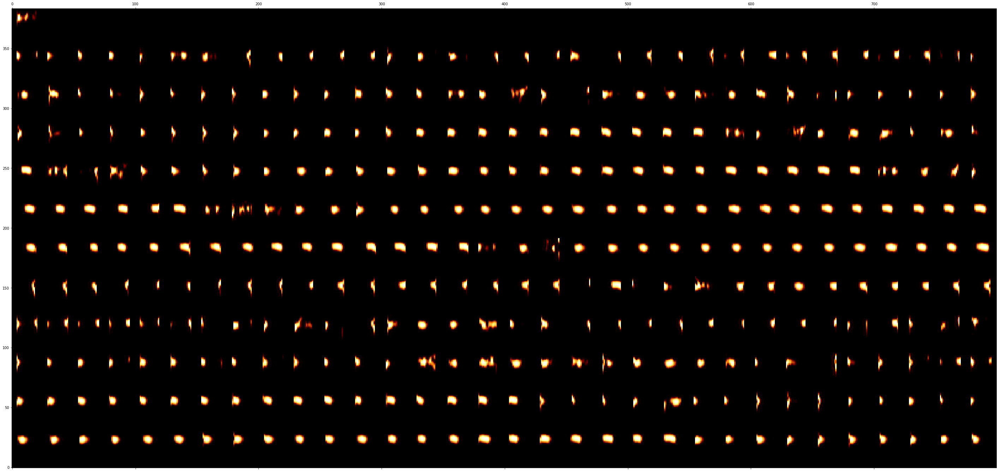

521ss2 316
(50.0, 20) (320, 800) 25.0 32 800


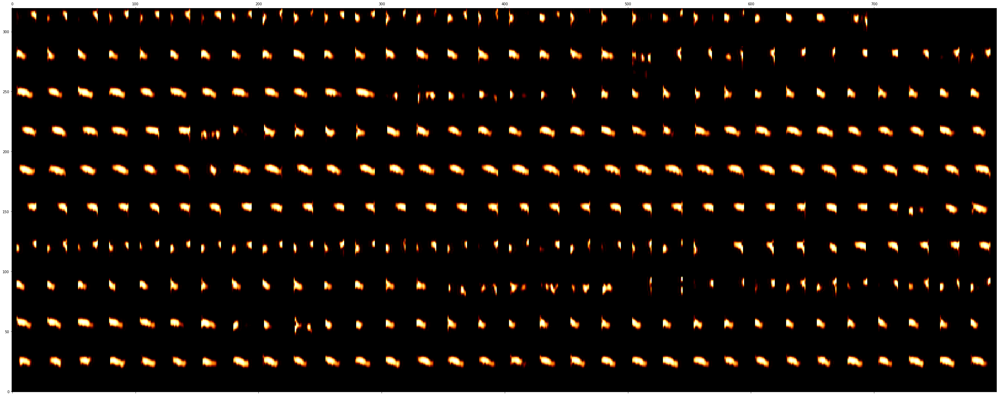

551ss 134
(50.0, 10) (160, 800) 25.0 32 800


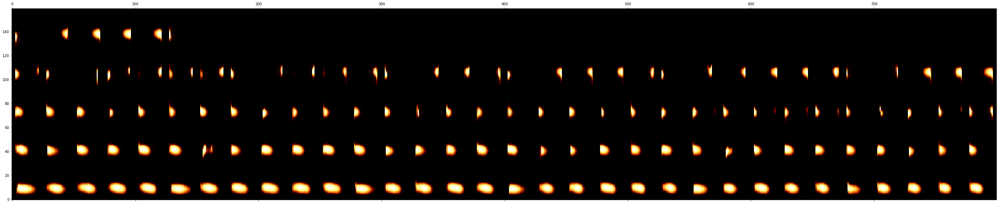

575sl 184
(50.0, 12) (192, 800) 25.0 32 800


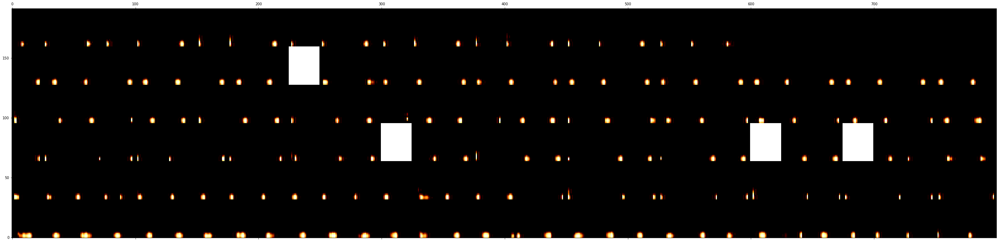

577sl 306
(50.0, 20) (320, 800) 25.0 32 800


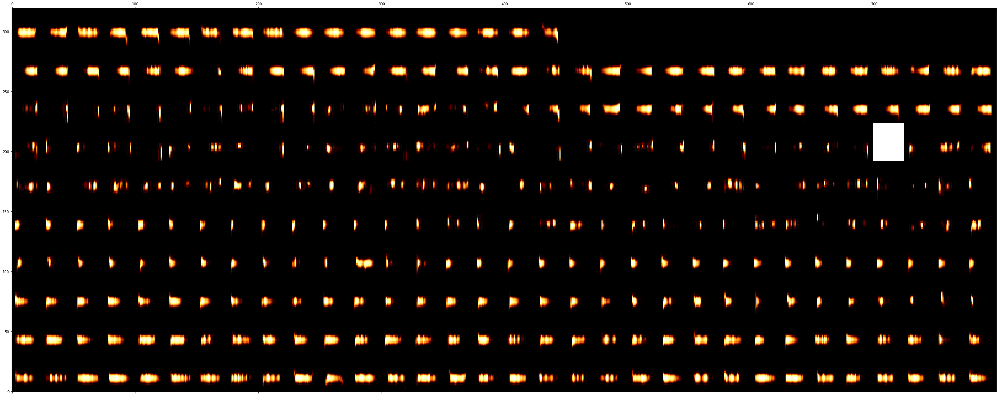

582ss 168
(50.0, 12) (192, 800) 25.0 32 800


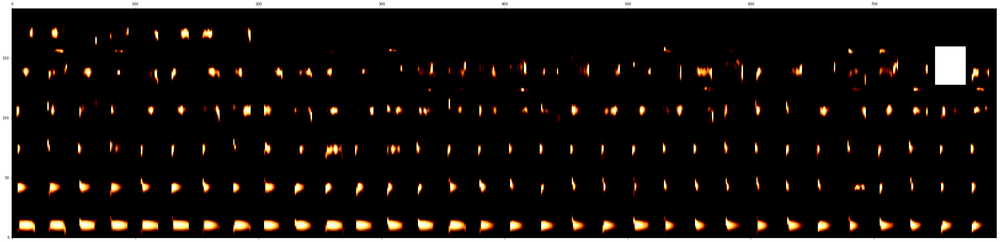

585ss 137
(50.0, 10) (160, 800) 25.0 32 800


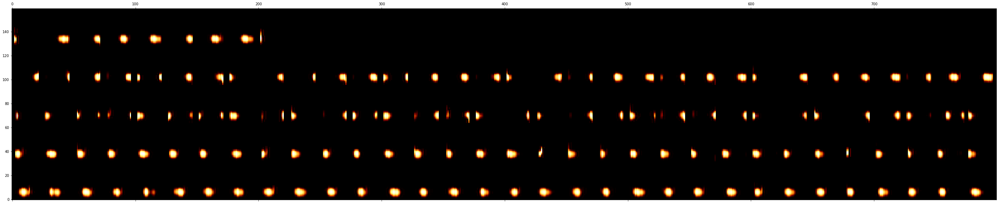

585ssh 172
(50.0, 12) (192, 800) 25.0 32 800


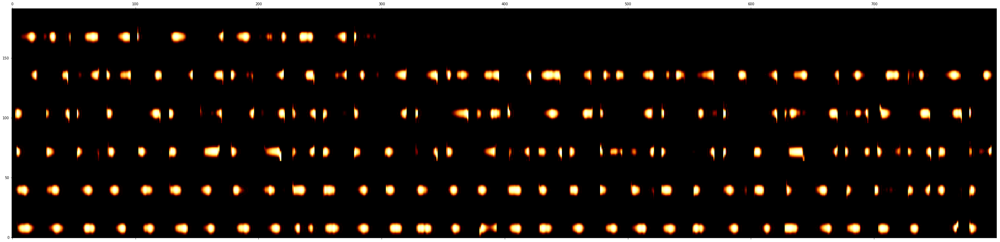

585ssj 134
(50.0, 10) (160, 800) 25.0 32 800


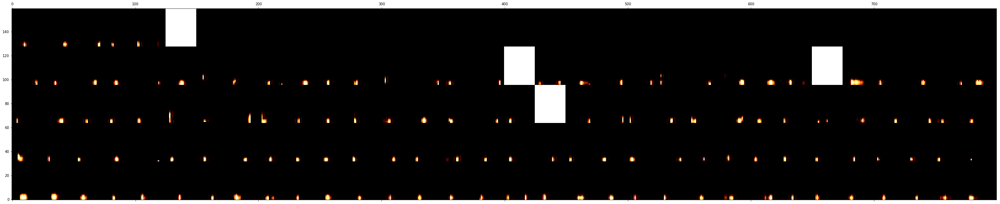

585sso 62
(50.0, 4) (64, 800) 25.0 32 800


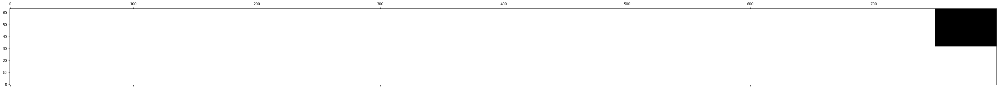

587ss 183
(50.0, 12) (192, 800) 25.0 32 800


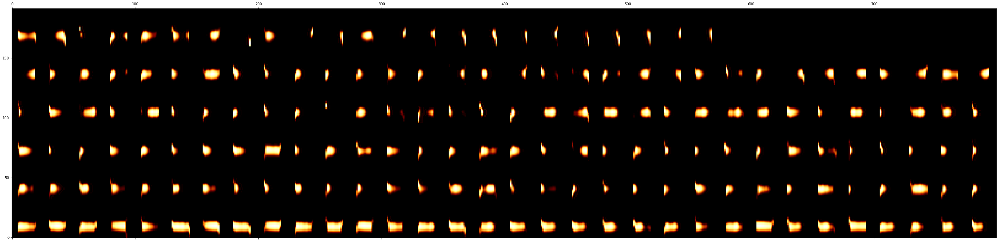

588ss 121
(50.0, 8) (128, 800) 25.0 32 800


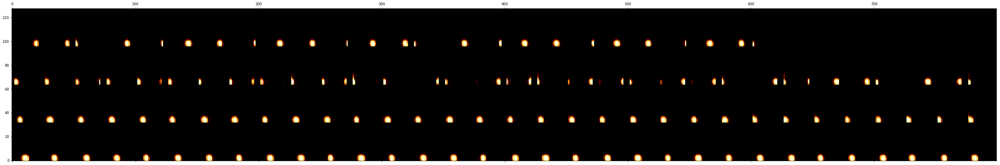

590ss 312
(50.0, 20) (320, 800) 25.0 32 800


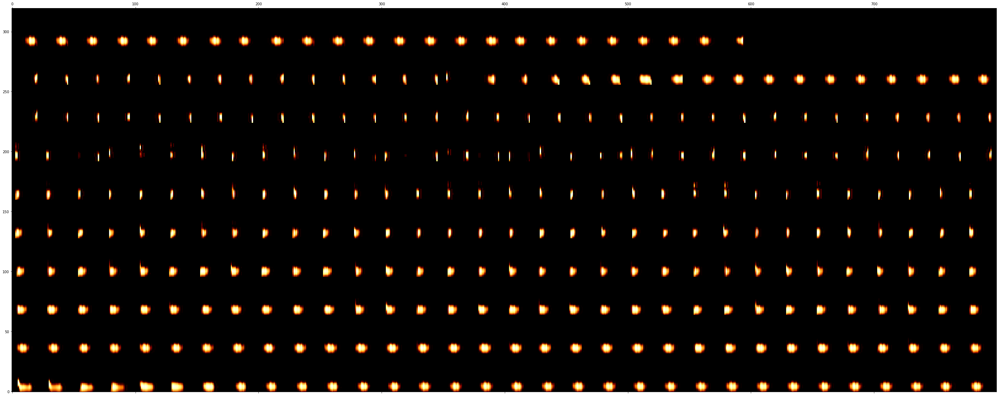

591sl 227
(50.0, 16) (256, 800) 25.0 32 800


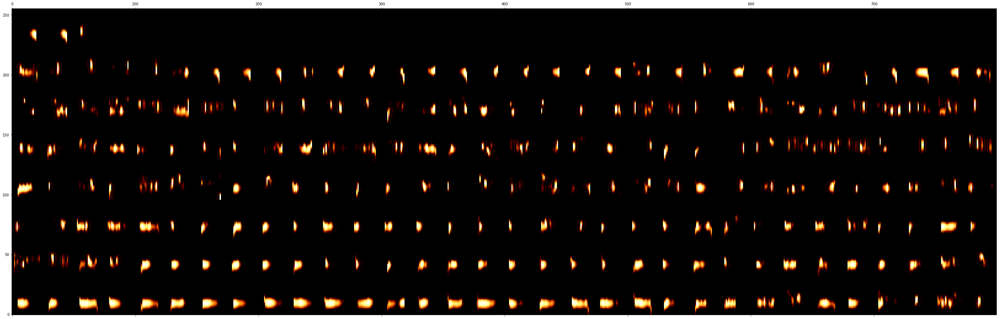

593ss 2
(50.0, 2) (32, 800) 25.0 32 800


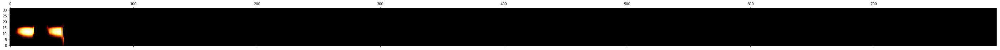

594ss 306
(50.0, 20) (320, 800) 25.0 32 800


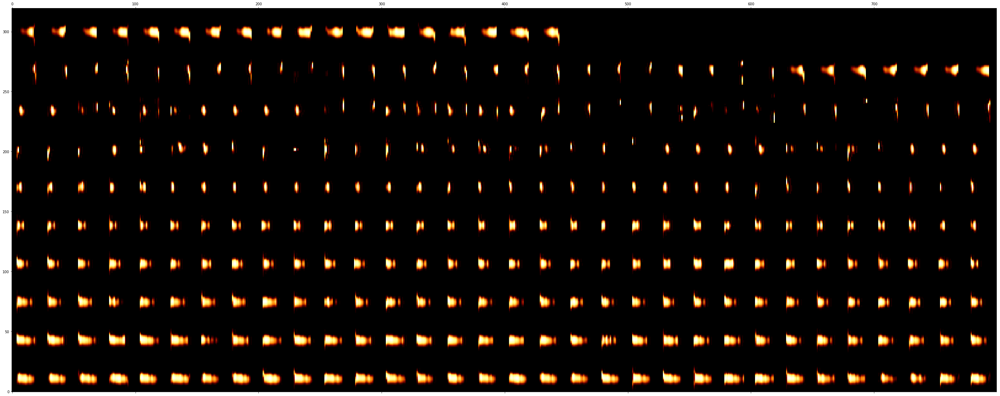

601ss 497
(50.0, 32) (512, 800) 25.0 32 800


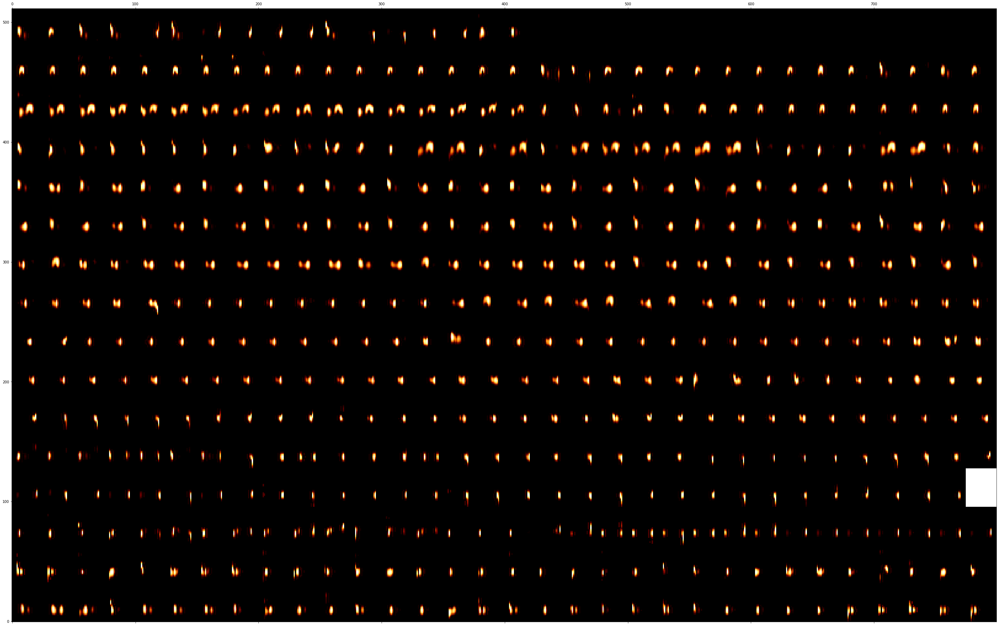

612ss 185
(50.0, 12) (192, 800) 25.0 32 800


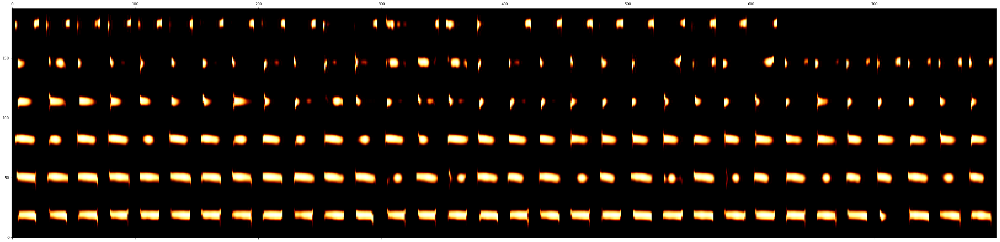

613ss 196
(50.0, 14) (224, 800) 25.0 32 800


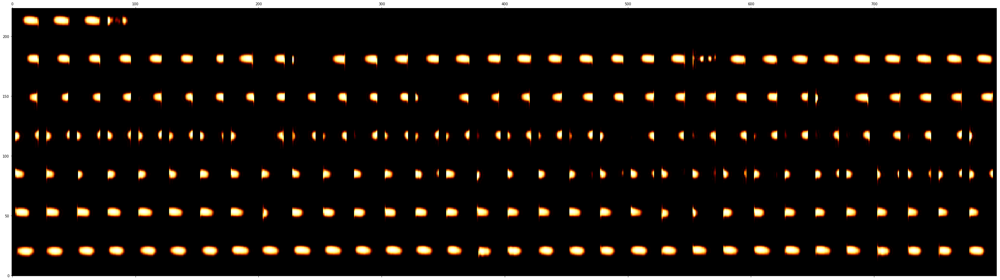

615ss 34
(50.0, 4) (64, 800) 25.0 32 800


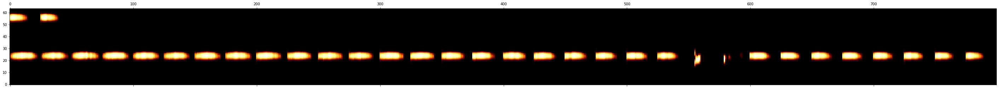

617ss 102
(50.0, 8) (128, 800) 25.0 32 800


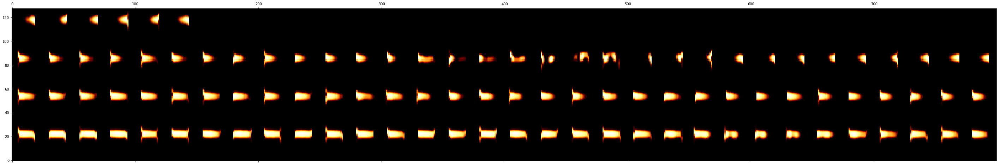

618ss 185
(50.0, 12) (192, 800) 25.0 32 800


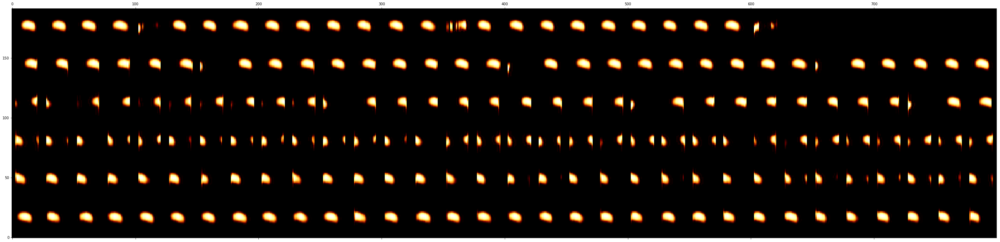

619ss 219
(50.0, 14) (224, 800) 25.0 32 800


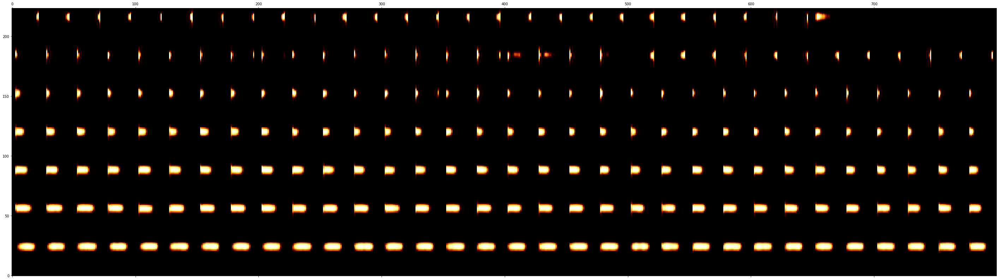

621ss 41
(50.0, 4) (64, 800) 25.0 32 800


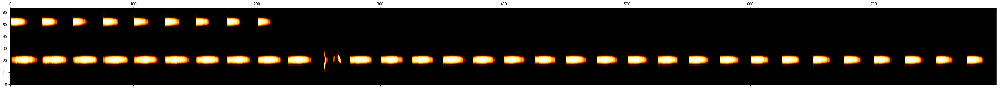

622ss 66
(50.0, 6) (96, 800) 25.0 32 800


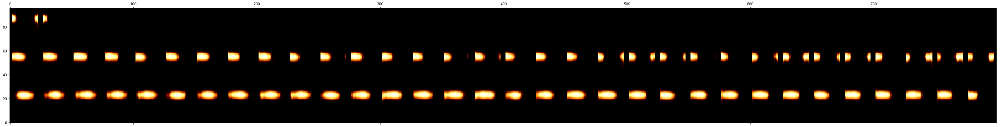

623ss 162
(50.0, 12) (192, 800) 25.0 32 800


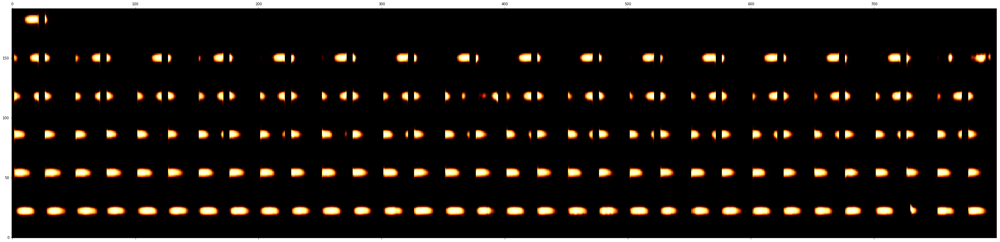

624ss 314
(50.0, 20) (320, 800) 25.0 32 800


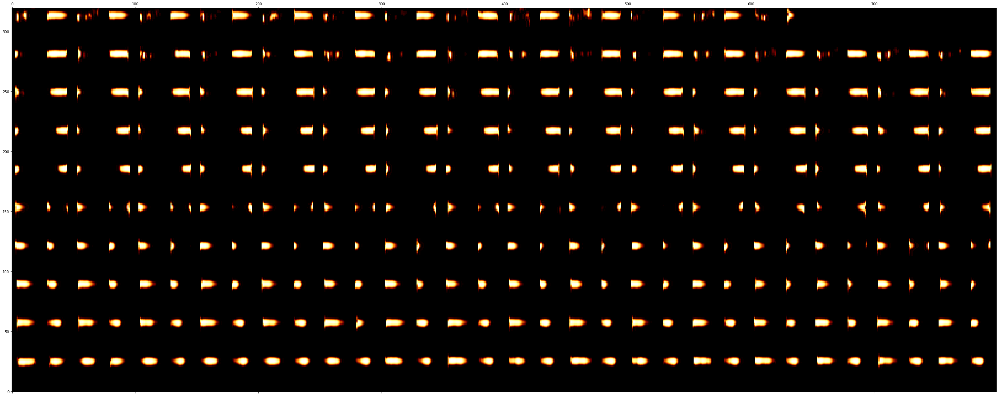

671ss 166
(50.0, 12) (192, 800) 25.0 32 800


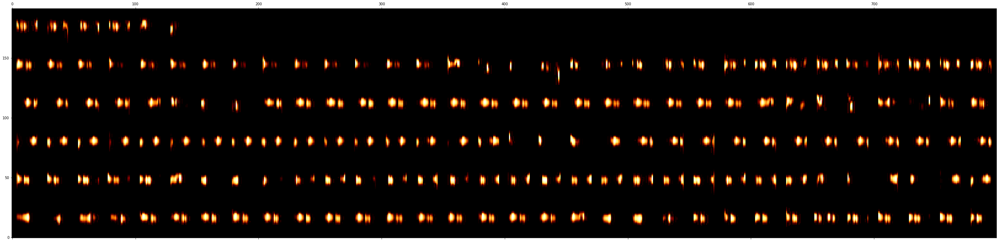

672ss 56
(50.0, 4) (64, 800) 25.0 32 800


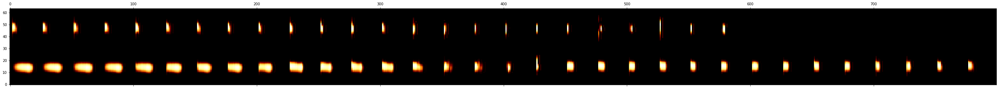

679ss 364
(50.0, 24) (384, 800) 25.0 32 800


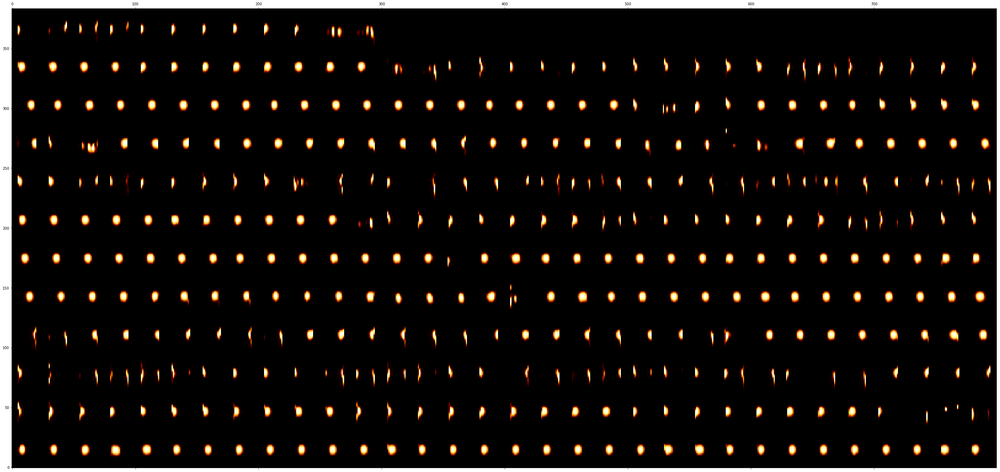

682ss 20
(50.0, 2) (32, 800) 25.0 32 800


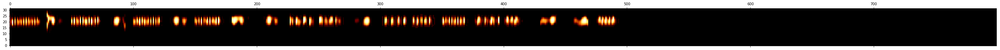

683ss 39
(50.0, 4) (64, 800) 25.0 32 800


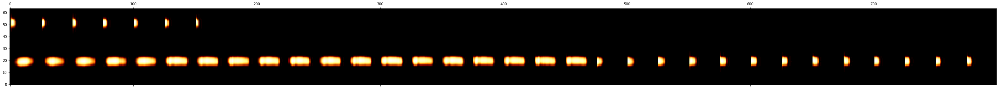

684ss 69
(50.0, 6) (96, 800) 25.0 32 800


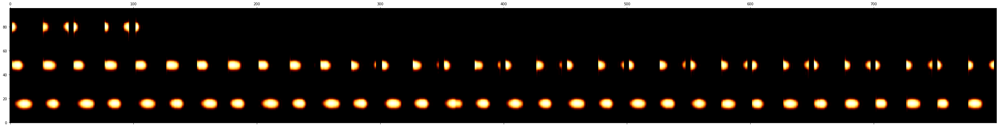

685ss 26
(50.0, 2) (32, 800) 25.0 32 800


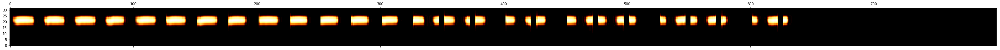

686ss 53
(50.0, 4) (64, 800) 25.0 32 800


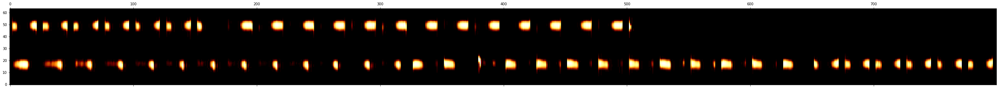

enma-koorogi 264
(50.0, 18) (288, 800) 25.0 32 800


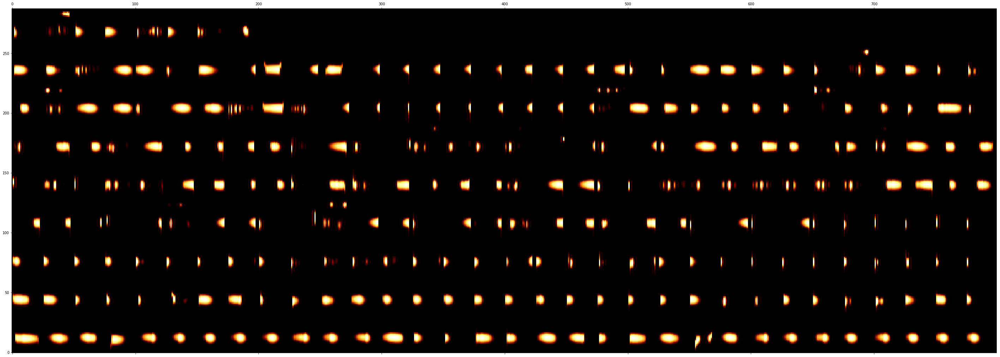

ezo-enma 152
(50.0, 10) (160, 800) 25.0 32 800


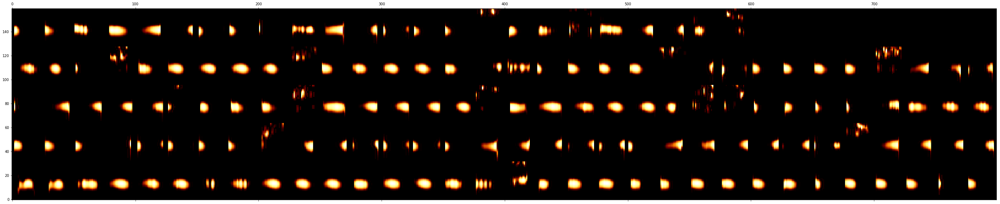

ezo-suzu 396
(50.0, 26) (416, 800) 25.0 32 800


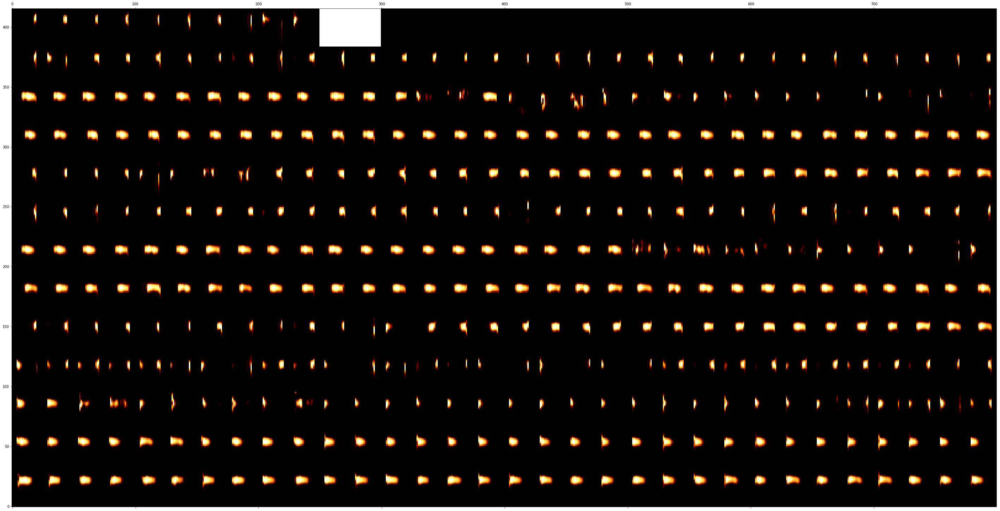

fall 36
(50.0, 4) (64, 800) 25.0 32 800


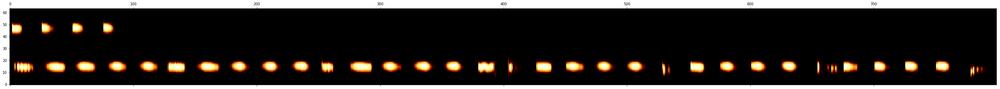

fieldcricket1 68
(50.0, 6) (96, 800) 25.0 32 800


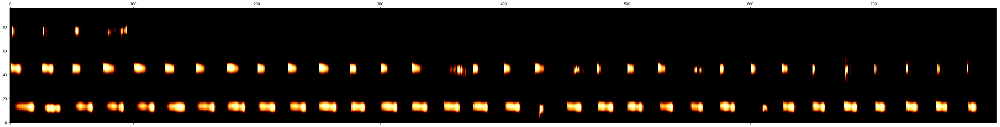

hama-suzu 1623
(50.0, 32) (512, 800) 25.0 32 800


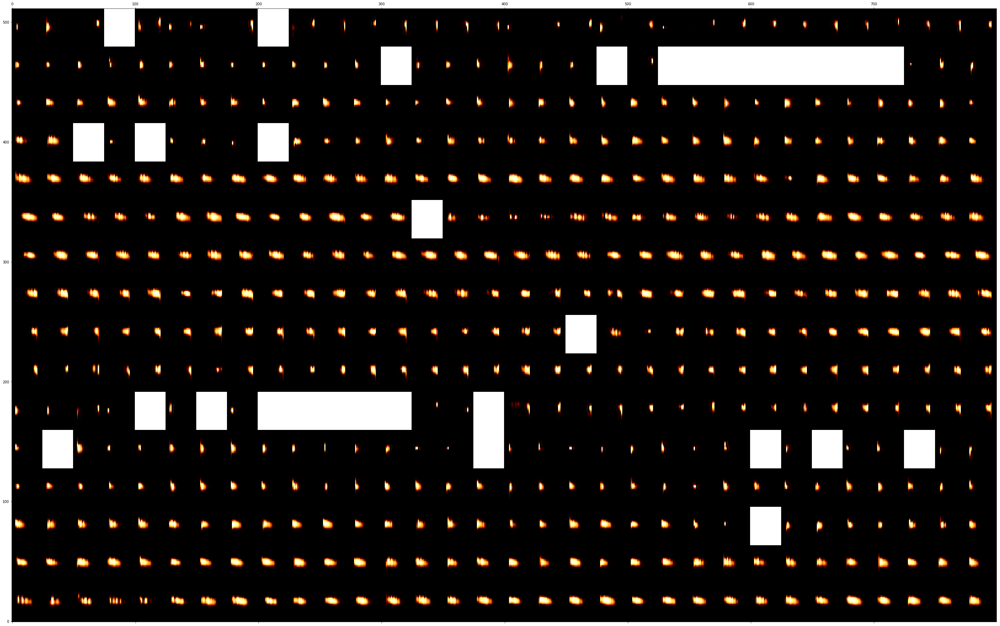

haraokame 593
(50.0, 32) (512, 800) 25.0 32 800


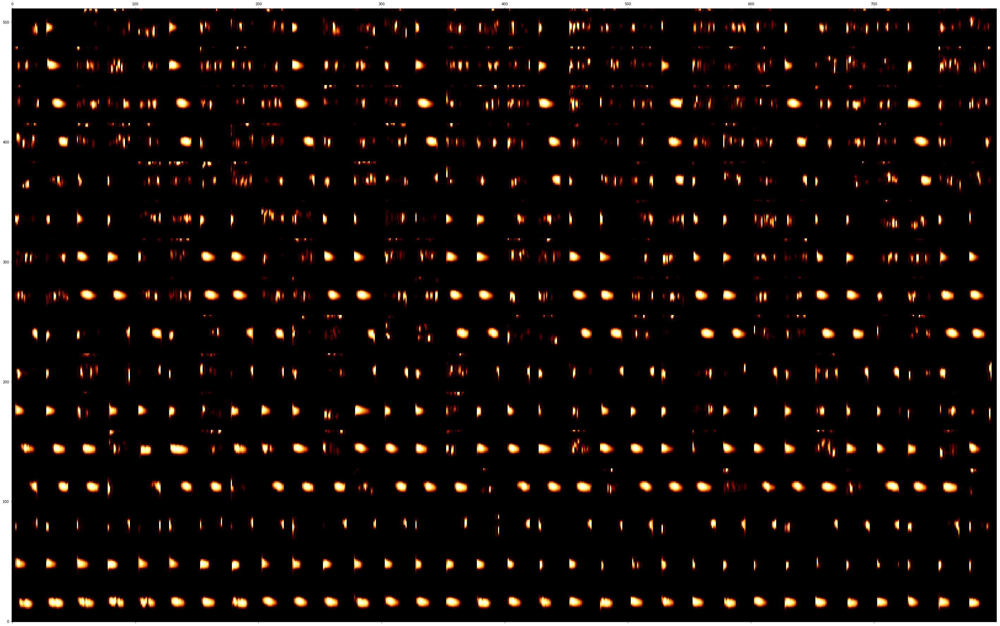

hime-koorogi 759
(50.0, 32) (512, 800) 25.0 32 800


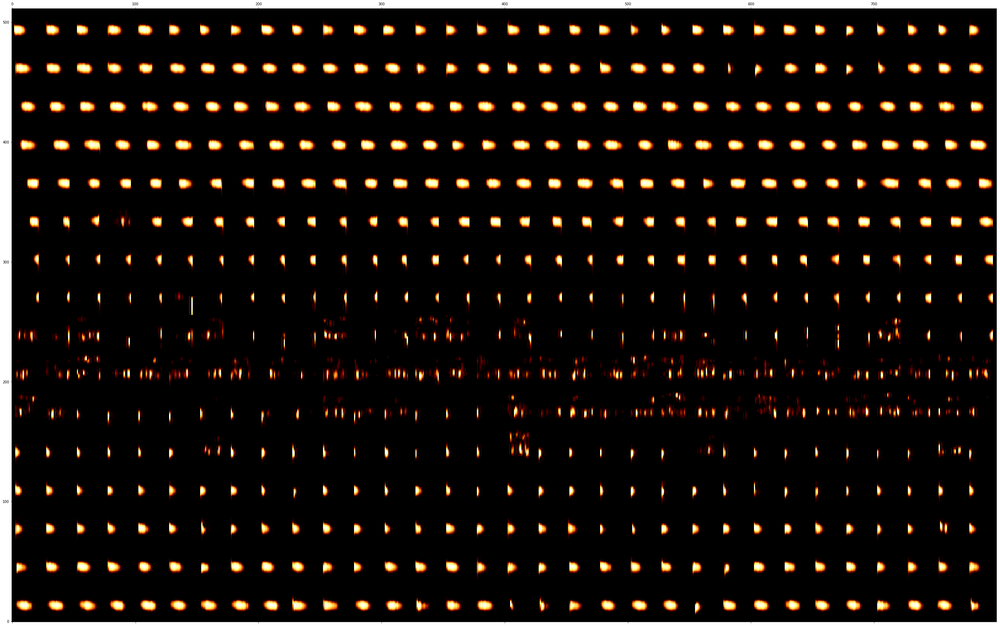

hime-suzu 799
(50.0, 32) (512, 800) 25.0 32 800


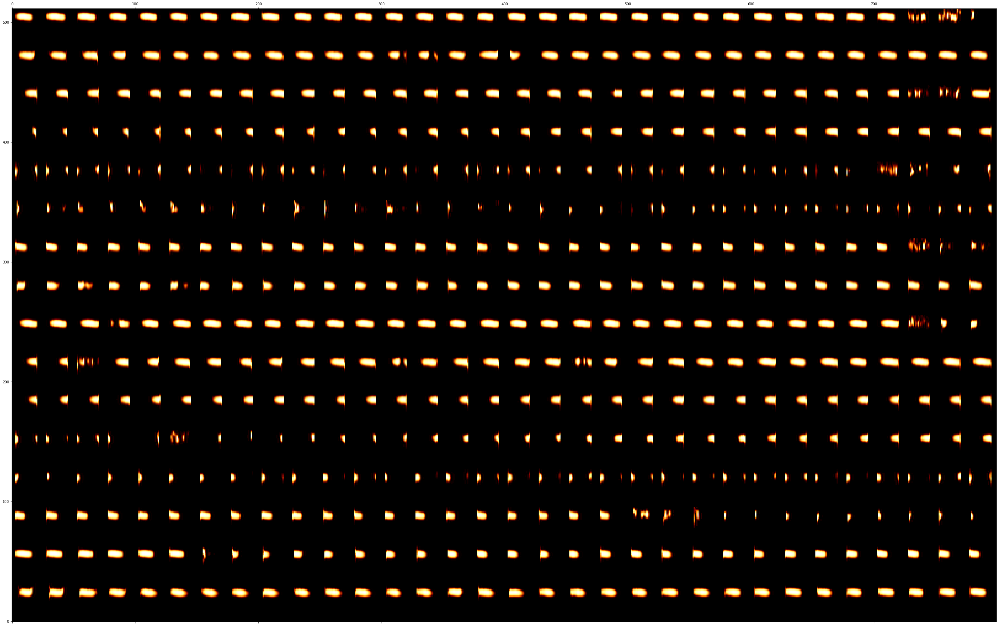

house 23
(50.0, 2) (32, 800) 25.0 32 800


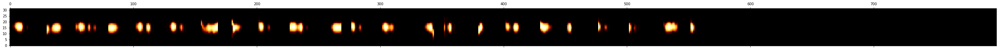

kamado 435
(50.0, 28) (448, 800) 25.0 32 800


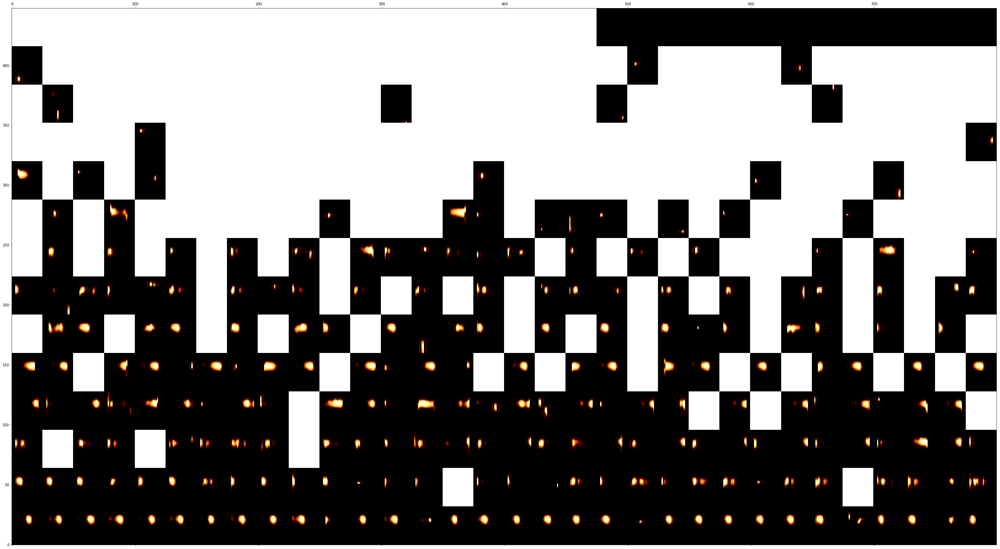

kawara-suzu 288
(50.0, 18) (288, 800) 25.0 32 800


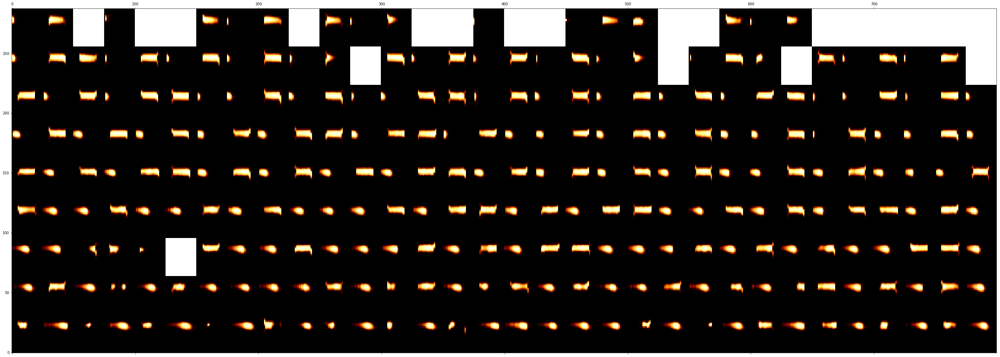

kaya-hibari 433
(50.0, 28) (448, 800) 25.0 32 800


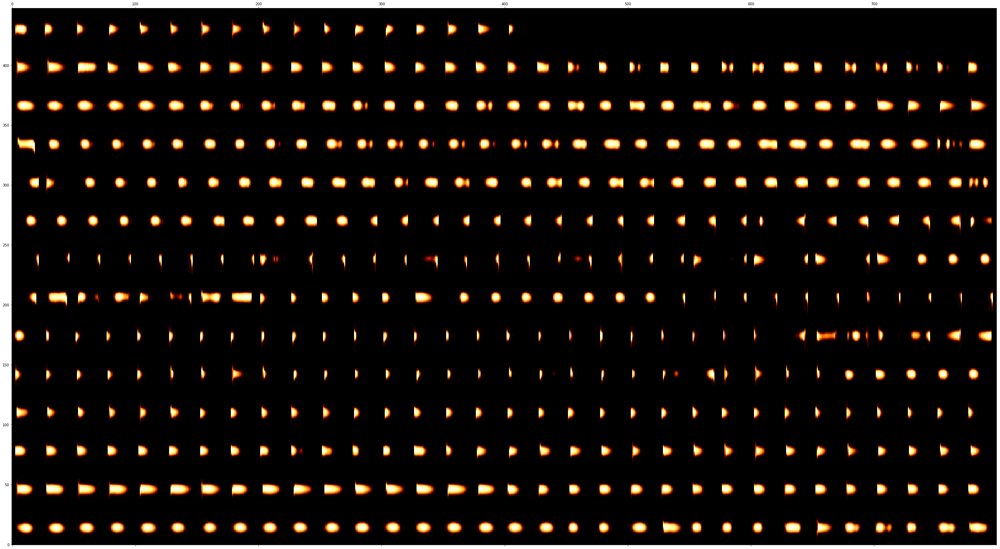

kinhibari 225
(50.0, 16) (256, 800) 25.0 32 800


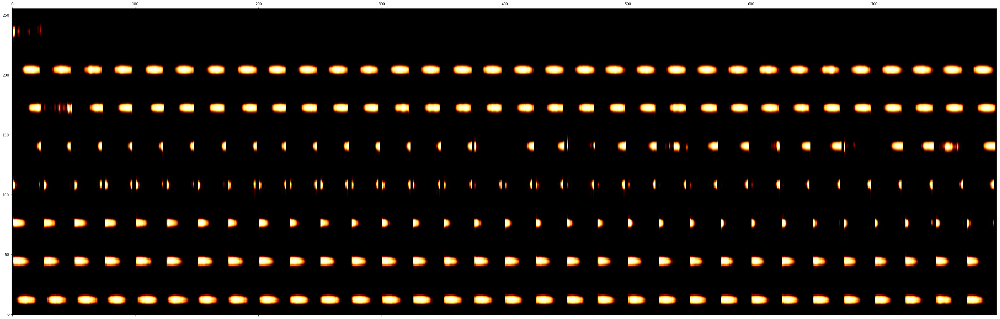

kogata-koorogi 301
(50.0, 20) (320, 800) 25.0 32 800


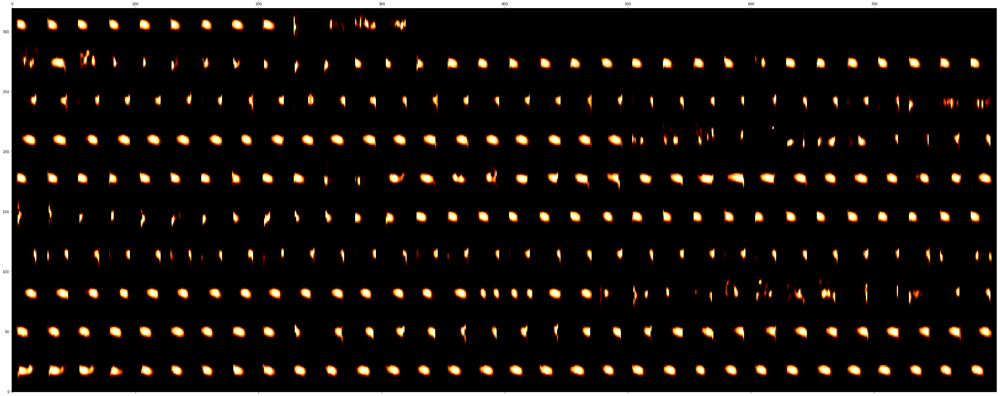

kuchinaga 75
(50.0, 6) (96, 800) 25.0 32 800


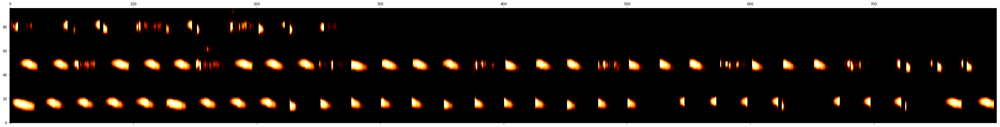

kuma-koorogi 192
(50.0, 12) (192, 800) 25.0 32 800


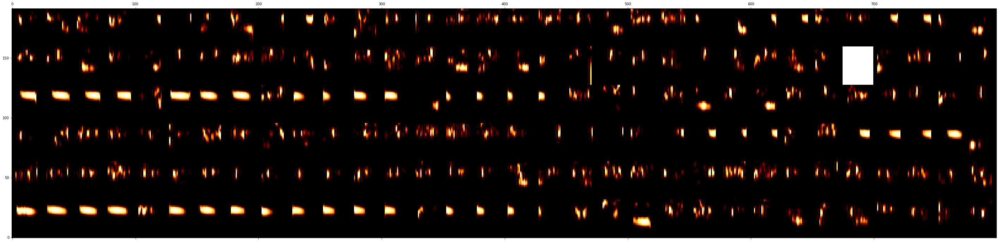

kumasuzumushi 931
(50.0, 32) (512, 800) 25.0 32 800


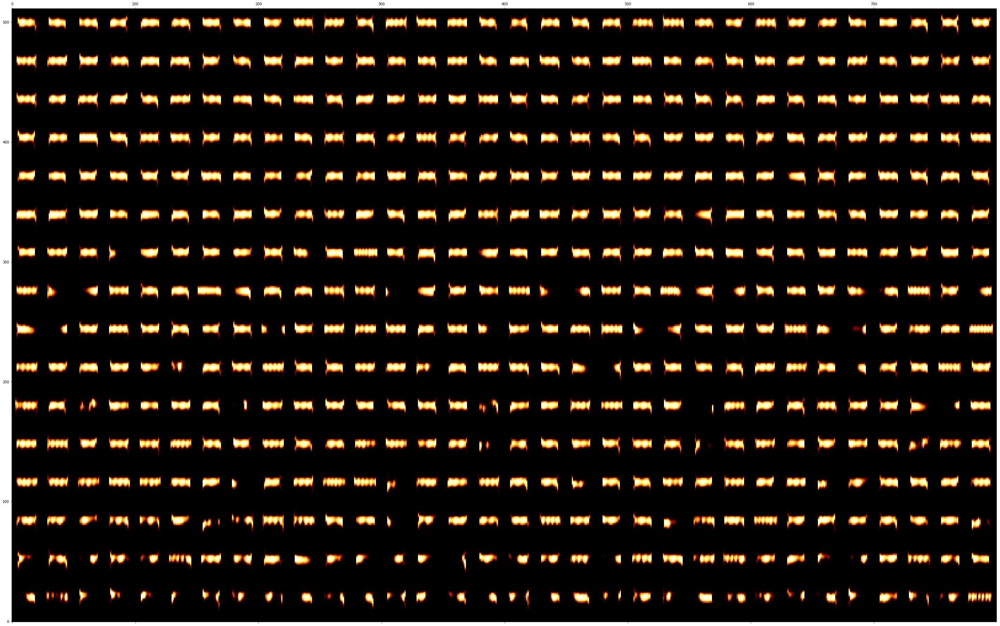

kurotsuya 328
(50.0, 22) (352, 800) 25.0 32 800


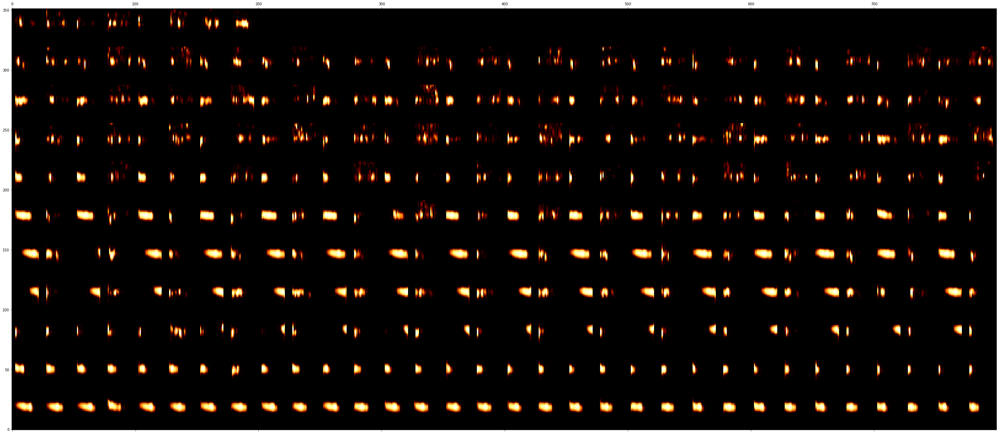

kusahibari 497
(50.0, 32) (512, 800) 25.0 32 800


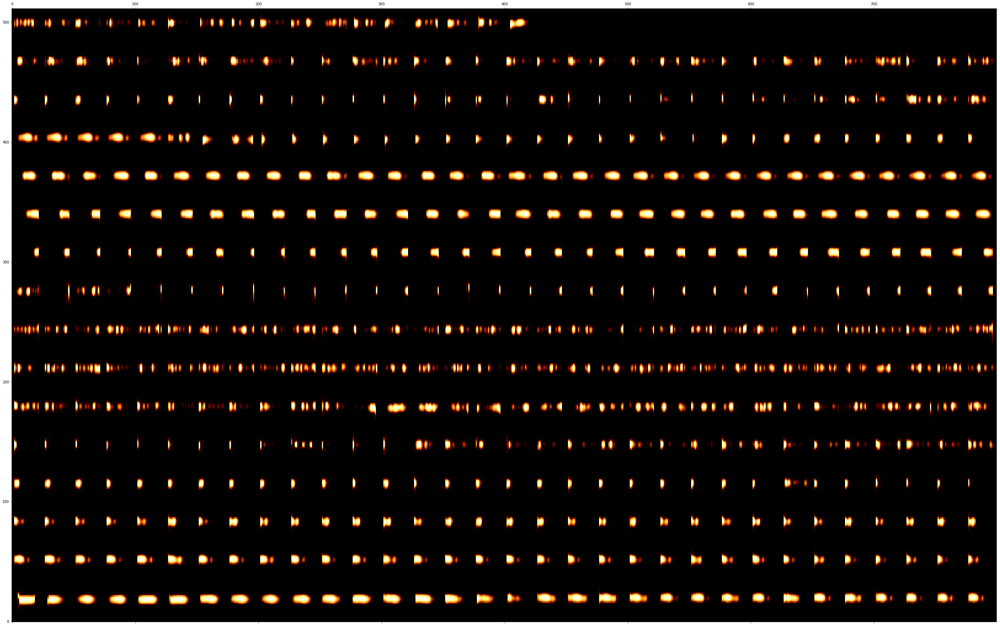

madara-suzu 1960
(50.0, 32) (512, 800) 25.0 32 800


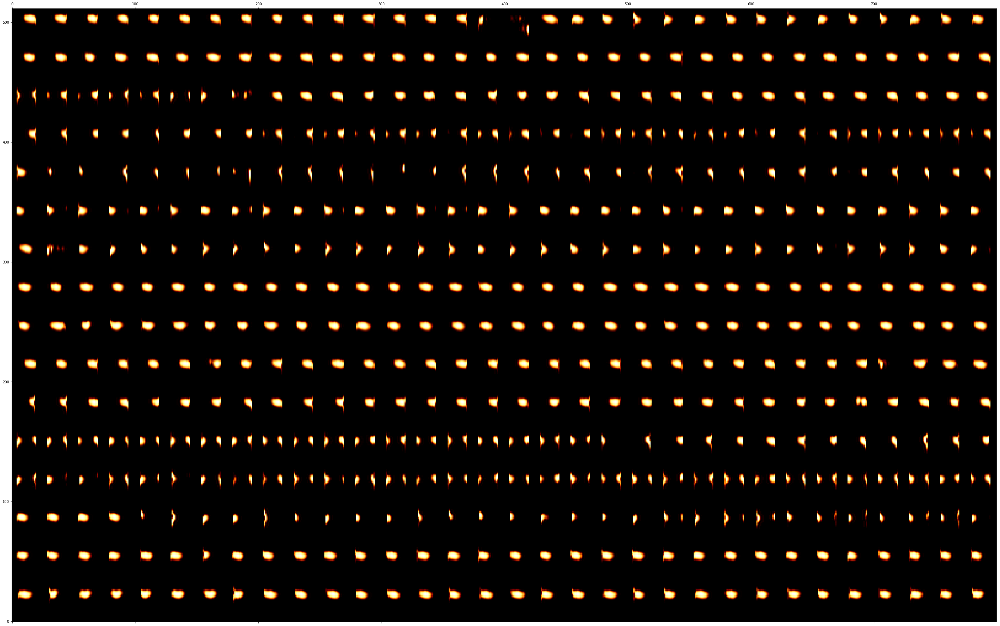

mitsukado 272
(50.0, 18) (288, 800) 25.0 32 800


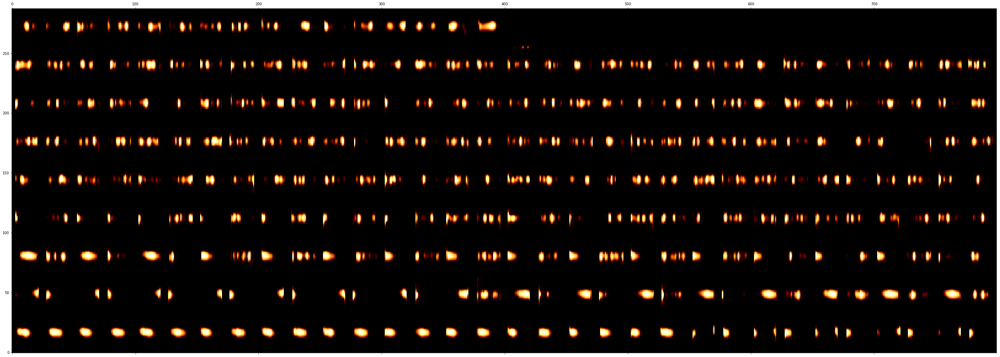

moriokame2 619
(50.0, 32) (512, 800) 25.0 32 800


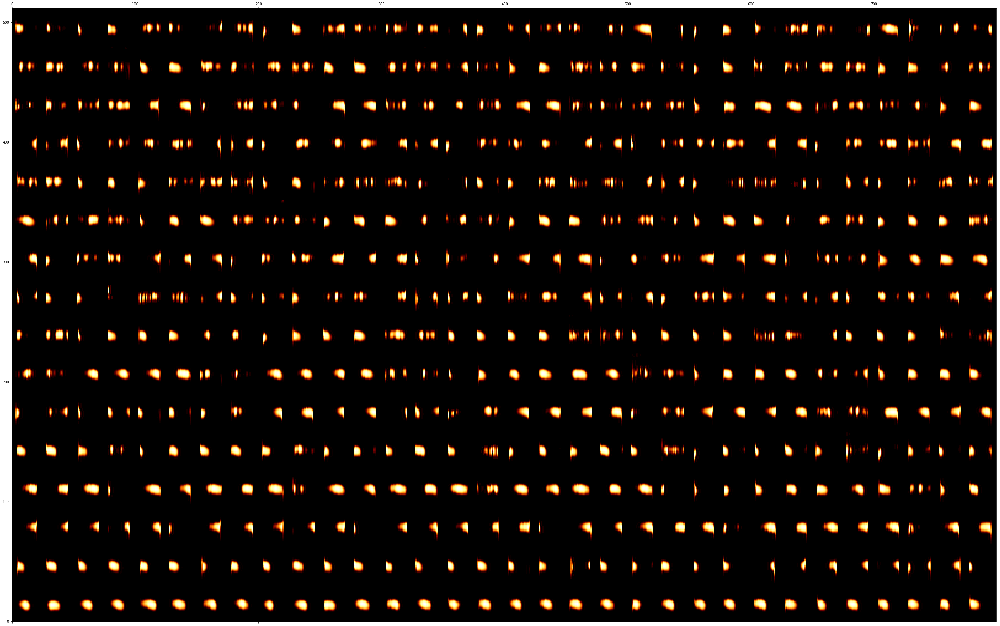

northern 158
(50.0, 10) (160, 800) 25.0 32 800


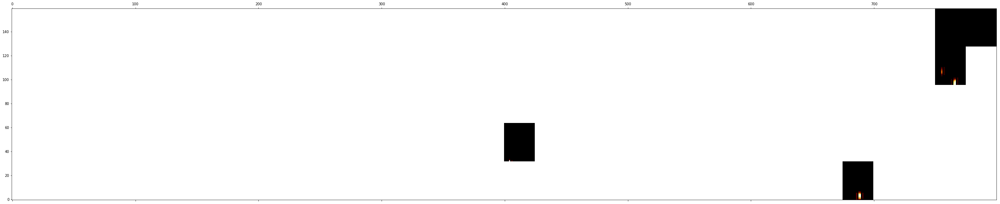

oookame 252
(50.0, 16) (256, 800) 25.0 32 800


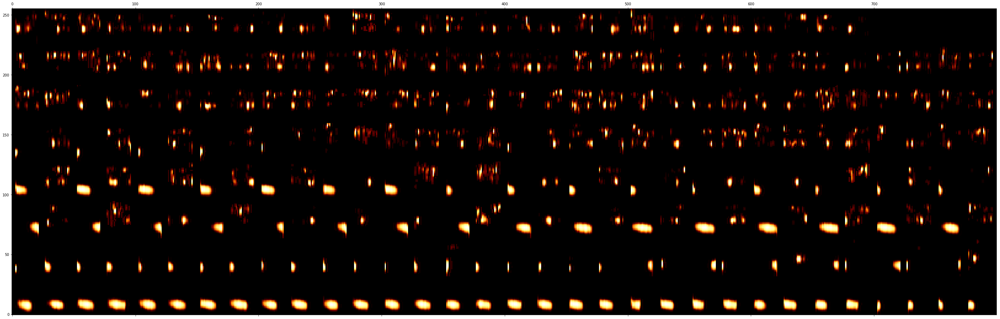

shiba-suzu 1299
(50.0, 32) (512, 800) 25.0 32 800


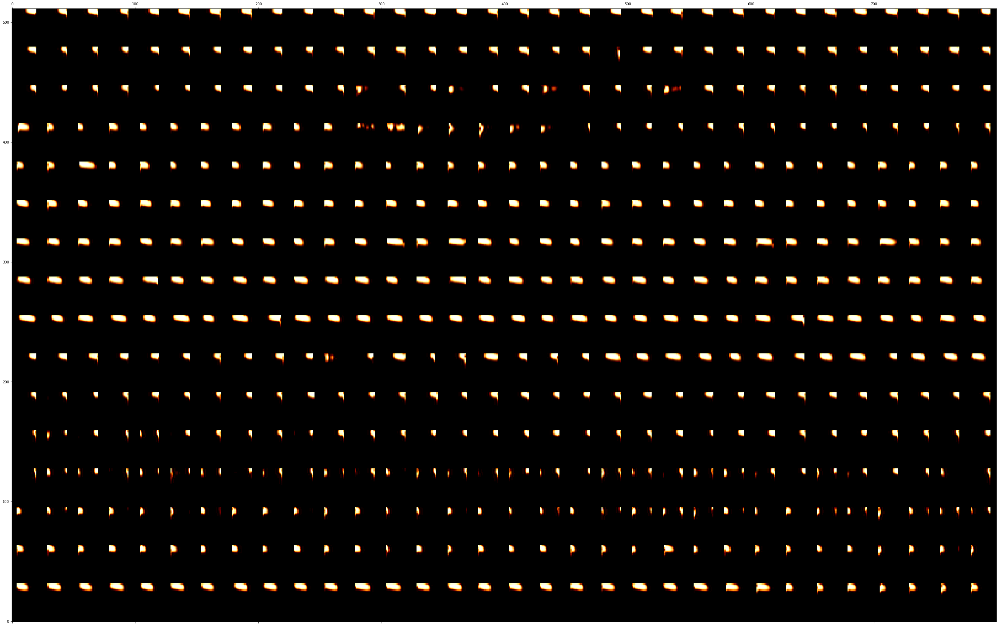

snowy 232
(50.0, 16) (256, 800) 25.0 32 800


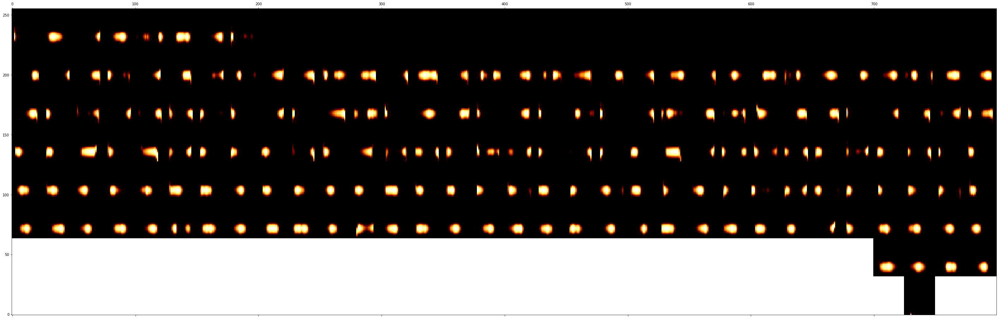

spring 48
(50.0, 4) (64, 800) 25.0 32 800


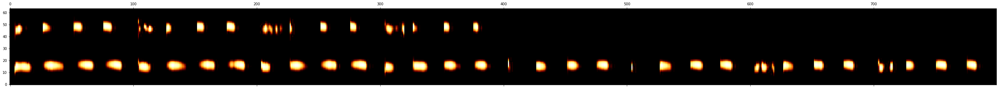

taiwan-enma 432
(50.0, 28) (448, 800) 25.0 32 800


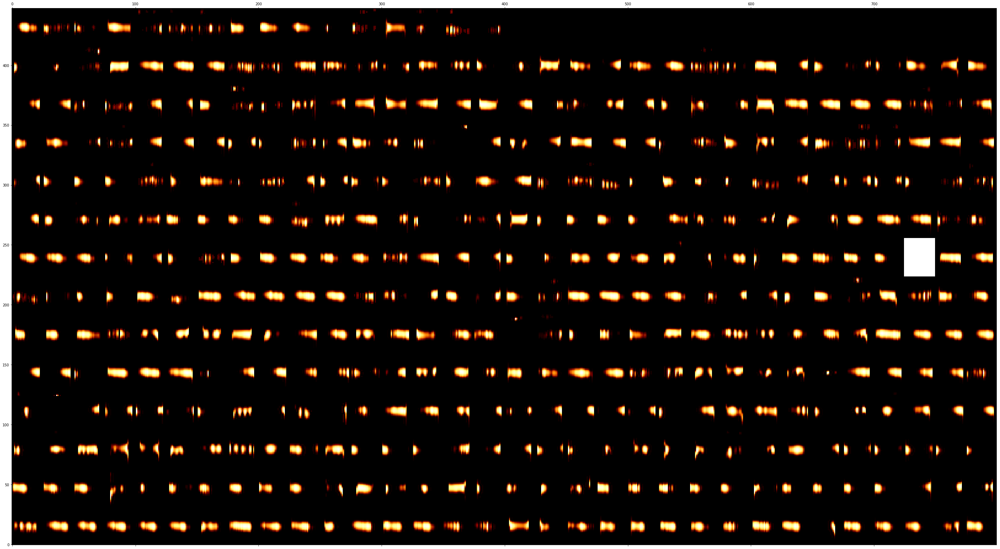

tanbo-koorogi 302
(50.0, 20) (320, 800) 25.0 32 800


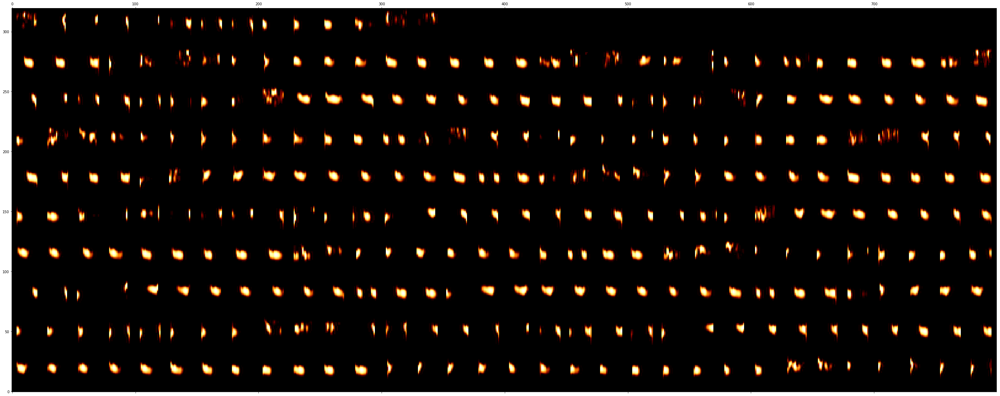

tanbookame 189
(50.0, 12) (192, 800) 25.0 32 800


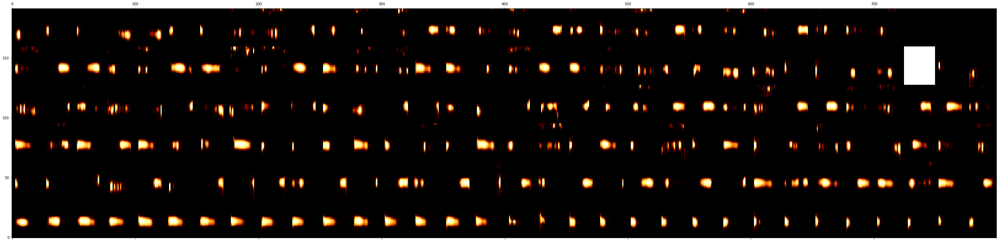

treecricket 197
(50.0, 14) (224, 800) 25.0 32 800


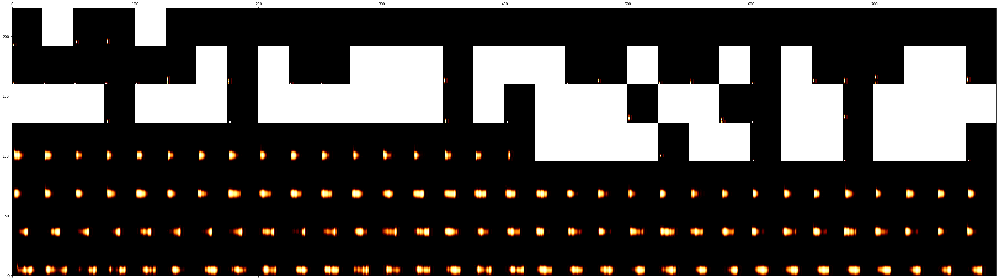

tsuzuresase 506
(50.0, 32) (512, 800) 25.0 32 800


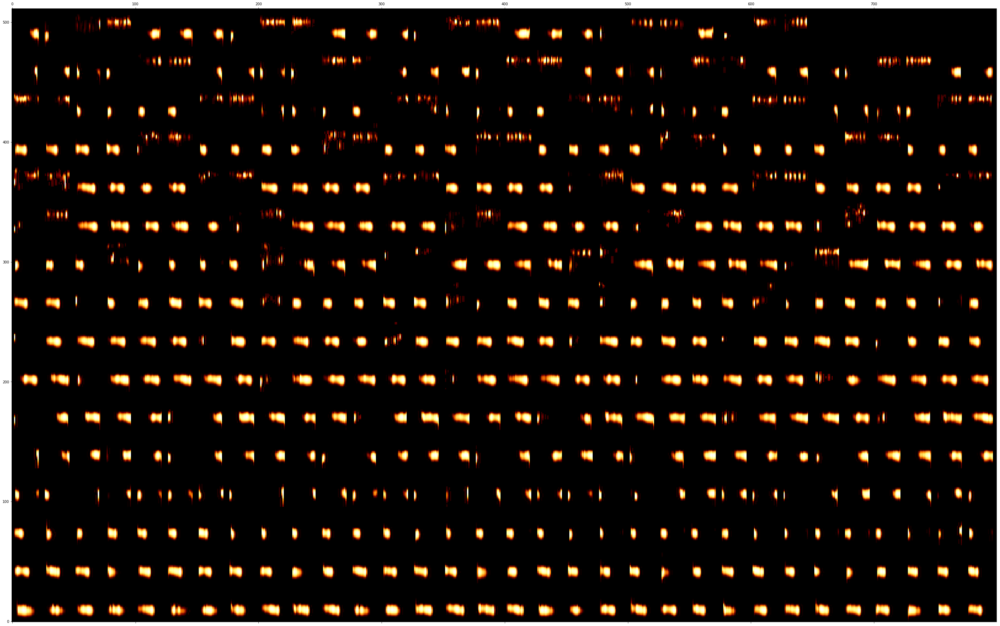

yamato-hibari 962
(50.0, 32) (512, 800) 25.0 32 800


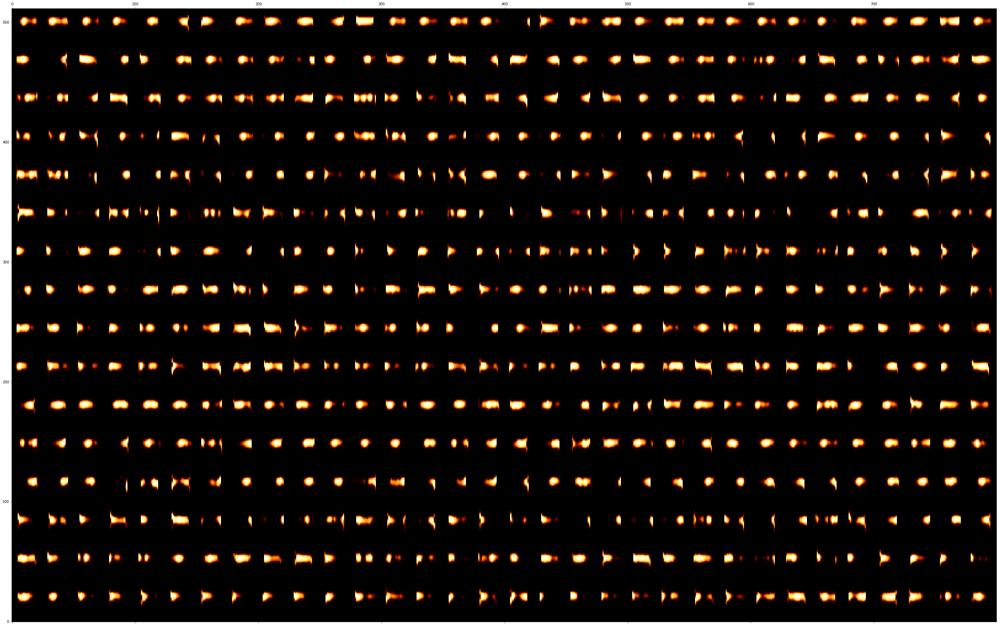

In [ ]:
for indv in np.sort(syllable_df.indv.unique()):
    print(indv, np.sum(syllable_df.indv == indv))
    specs = np.array([i/np.max(i) for i in syllable_df[syllable_df.indv == indv].spectrogram.values])
    specs[specs<0] = 0
    draw_spec_set(specs, zoom=2,
                  maxrows=16, 
                  colsize=25)

### save dataset

In [ ]:
save_loc = DATA_DIR / 'syllable_dfs' / DATASET_ID / 'cricket.pickle'
ensure_dir(save_loc)
syllable_df.to_pickle(save_loc)